# ADCP
Correções de offset vertical e declinação magnética foram realizadas no Winriver2.
O mesmo também foi usado para exportar os dados no formato ASCII (.TXT), que é utilizado neste algoritmo.

### Importando Bibliotecas

In [3]:
import pandas as pd  # Biblioteca para manipulação e análise de dados, especialmente para trabalhar com DataFrames
import numpy as np  # Biblioteca para suporte a arrays e operações matemáticas de alto desempenho
from matplotlib.dates import num2date  # Função para converter números de datas em objetos datetime
import pytz  # Biblioteca para manipulação de fusos horários

from scipy.stats import linregress  # Função para realizar regressão linear e análise estatística

import matplotlib.pyplot as plt  # Biblioteca para criação de gráficos e visualizações 2D
import rasterio  # Biblioteca para leitura e escrita de dados geoespaciais em formatos de raster
from rasterio.plot import show  # Função para exibir rasters como imagens
from matplotlib.colors import LinearSegmentedColormap  # Classe para criação de mapas de cores personalizados
from mpl_toolkits.axes_grid1 import make_axes_locatable  # Ferramenta para ajustar a posição das barras de cores nos gráficos

import geopandas as gpd  # Extensão do pandas para suportar dados geoespaciais
from shapely.geometry import Point, LineString  # Classes para criar e manipular objetos geométricos (pontos, linhas)

from matplotlib.colors import TwoSlopeNorm  # Classe para normalização de dados em torno de um ponto central
import plotly.graph_objects as go  # Módulo principal para criar gráficos interativos com Plotly
import plotly.express as px  # Biblioteca para visualização de dados interativos simplificada com Plotly
from matplotlib.dates import DateFormatter  # Classe para formatação de datas em gráficos Matplotlib

### Define o Caminho dos Arquivos

In [5]:
# Caminho do arquivo com os dados
caminho_arquivo = "adcp_20210227_1.TXT"

In [6]:
# Caminho do basemap
basemap_path = "basemap_cNautica.tif"
basemap = rasterio.open(basemap_path)

### Funções 

#### Função de Leitura do Arquivo e Organização dos Dados 

In [9]:
def ler_dados_adcp(caminho_arquivo):
    """
    Função para ler os dados do arquivo ADCP em formato TXT e convertê-los em um DataFrame do pandas.

    Parameters:
    - caminho_arquivo (str): O caminho completo do arquivo TXT.

    Returns:
    - pd.DataFrame: DataFrame contendo os dados do arquivo ADCP.
    """
    
    try:
        # Definir os índices dos parâmetros
        indices = [0, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 20, 21, 22, 23, 24, 25]
    
        # Ler o arquivo TXT
        with open(caminho_arquivo, 'r') as arquivo:
            linhas = arquivo.readlines()
    
        # Criar listas vazias para armazenar os dados
        dados = {indice: [] for indice in indices}
    
        # Iterar sobre as linhas e extrair os dados
        for linha in linhas:
            valores = linha.split()
    
            for indice in indices:
                # Se o índice for de um parâmetro com valores separados por vírgula, dividir os valores
                if indice in [6, 7, 8, 9]:
                    valores_parametro = valores[indice].split(',')
                    dados[indice].append(valores_parametro)
                else:
                    dados[indice].append(valores[indice])
    
        # Criar o DataFrame usando o pandas
        df = pd.DataFrame(dados)
    
        # Renomear as colunas
        nomes_colunas = {
            0: 'ensemble',
            2: 'datahora',
            3: 'niveis',
            4: 'avgBack',
            5: 'porcentagem_bons',
            6: 'u',
            7: 'v',
            8: 'w',
            9: 'q',
            11: 'profundidade',
            12: 'qEnsemble',
            13: 'areaEnsemble',
            14: 'direcao_fluxo',
            15: 'direcao_rio',
            20: 'heading',
            21: 'pitch',
            22: 'roll',
            23: 'temperatura',
            24: 'latitude',
            25: 'longitude'
        }
    
        # Renomeando as colunas do DataFrame utilizando o dicionário de mapeamento
        # O dicionário 'nomes_colunas' contém as correspondências entre os nomes antigos e os novos das colunas
        # O parâmetro 'inplace=True' indica que a alteração deve ser feita no DataFrame original, sem a necessidade de atribuição
        df.rename(columns=nomes_colunas, inplace=True)
    
        # Converter a coluna datahora de unix para datetime
        df['datahora'] = df['datahora'].astype(float) / (24 * 3600)
        df['datahora'] = df['datahora'].apply(num2date)
    
        # Ajustar o fuso horário para o Sul do Brasil
        sul_brasil_tz = pytz.timezone('America/Sao_Paulo')
        df['datahora'] = df['datahora'].apply(lambda x: x.replace(tzinfo=sul_brasil_tz))
    
        # Converter strings para float e int nos parâmetros
        colunas_numericas = ['ensemble', 'u', 'v', 'w', 'q', 'qEnsemble', 'areaEnsemble', 'profundidade',
                              'direcao_fluxo', 'direcao_rio', 'heading', 'pitch', 'roll', 'temperatura', 'latitude', 'longitude']
    
        # Converter strings para float e int nos parâmetros
        df[colunas_numericas] = df[colunas_numericas].map(lambda x: pd.to_numeric(x, errors='coerce'))
    
        # Converter strings para float e int nos parâmetros
        for coluna in ['niveis', 'avgBack', 'porcentagem_bons']:
            df[coluna] = df[coluna].apply(lambda x: pd.to_numeric(x.split(','), errors='coerce'))
    
        
    
        def iterar_sobre_arranjo(arranjo):
            """
            Função para iterar sobre um arranjo, substituindo um valor específico por pd.NA.
        
            Parameters:
            - arranjo (list): O arranjo a ser iterado.
        
            Returns:
            - list: O arranjo resultante.
            """
            # Definindo o valor específico a ser substituído por pd.NA
            valor_especifico = -32768.0000
            
            # Usando uma list comprehension para iterar sobre o arranjo
            # Substituindo o valor específico por pd.NA, mantendo os outros valores inalterados
            resultado = [pd.NA if valor == valor_especifico else valor for valor in arranjo]
            
            # Retornando o arranjo resultante
            return resultado
    
        
        # Lista de colunas que serão processadas pela função iterar_sobre_arranjo
        colunas_flag = ['avgBack', 'u', 'v', 'w', 'q']
        
        # Iterando sobre cada coluna na lista
        for coluna in colunas_flag:
            # Aplicando a função iterar_sobre_arranjo a cada elemento da coluna
            df[coluna] = df[coluna].apply(iterar_sobre_arranjo)
    
        # Substituir -32768.0000 por pd.NA nas colunas especificadas
        colunas_substituir = ['qEnsemble', 'areaEnsemble', 'direcao_fluxo', 'direcao_rio', 'heading', 
                              'pitch', 'roll', 'temperatura', 'latitude', 'longitude']
        df[colunas_substituir] = df[colunas_substituir].replace(-32768.0000, pd.NA)
    
    
        # Iterar sobre os valores na coluna para que cada arranjo tenha 50 valores, completando com pd.NA
        for arranjo in df['q']:
            if len(arranjo) < 50:
                diff = 50 - len(arranjo)
                # Substituir np.nan por pd.NA
                arranjo.extend([pd.NA] * diff)
    
    
        # Retornando o dataframe com os dados
        return df

    except Exception as e:
        print(f"Erro ao ler o arquivo: {e}")
        return None

#### Função para Substituir pd.NA por np.nan

In [11]:
def NA4nan(df, column_name):
    """
    Função para substituir valores NA em uma coluna do DataFrame por nan e converter para um array numpy transposto.

    Args:
    - df: DataFrame contendo os dados.
    - column_name: Nome da coluna a ser processada e convertida.

    Returns:
    - Array numpy transposto com os valores processados.
    """
    # Inicializa uma lista vazia para armazenar os valores da coluna
    lst = []

    # Itera sobre os valores da coluna, substituindo valores NA por 'np.nan'
    for value in df[column_name].fillna(pd.NA).values:
        temp_lst = []
        # Itera sobre os elementos de cada lista dentro da coluna
        for i in value:
            # Verifica se o elemento é NA
            if i is pd.NA:
                # Se for NA, adiciona 'np.nan' à lista temporária
                temp_lst.append(np.nan)
            else:
                # Caso contrário, adiciona o valor atual à lista temporária
                temp_lst.append(i)
        # Adiciona a lista temporária à lista principal
        lst.append(temp_lst)

    # Converte a lista de listas em um array numpy transposto
    arr = np.array(lst).T
    return arr


#### Função que encontra o valor máximo absoluto num array multidimensional, ignorando valores NaN

In [13]:
def ValMax(arr):
    """
    Encontra o valor absoluto máximo em um array numpy, ignorando valores NaN.

    Args:
    - arr: Array numpy de entrada.

    Returns:
    - max_abs_index: Índice do valor absoluto máximo no array original.
    - max_abs_value: Valor absoluto máximo no array original.
    """
    # Aplaina o array e encontra o índice do valor absoluto máximo, ignorando NaN
    max_abs_index_flat = np.nanargmax(np.abs(arr))
    
    # Converte o índice aplainado para o índice correspondente no array original
    max_abs_index = np.unravel_index(max_abs_index_flat, arr.shape)
    
    # Encontra o valor absoluto máximo, ignorando NaN
    max_abs_value = np.abs(arr[max_abs_index])
    
    return max_abs_value

### Pré Processamento ADCP

#### Chama a Função de Leitura e Atribui o Dataframe a uma Variável

In [24]:
# Chamar a função para iniciar o processo de seleção de arquivo
adcp_df = ler_dados_adcp(caminho_arquivo)

# Excluir a primeira linha, que está comprometida
adcp_df = adcp_df[1:]

#### Mapa de Localização dos Ensembles e Seleção de Ensembles

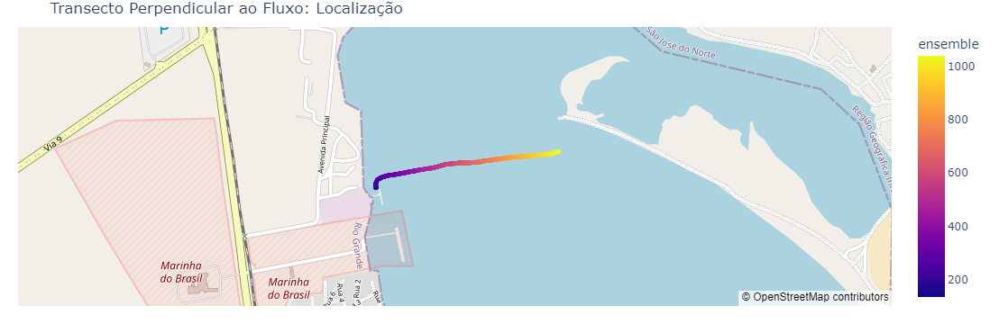

In [27]:
cor_palette = 'plasma'
fig = px.scatter_mapbox(adcp_df, lat="latitude", lon="longitude", hover_name='ensemble', zoom=14, height=300, 
                        color='ensemble', color_continuous_scale=cor_palette)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":20,"t":30,"l":20,"b":20},
                 title="Transecto Perpendicular ao Fluxo: Localização")

# Exibir o gráfico
fig.show()

In [29]:
# Extraindo os Ensembles do Transecto Perpendicular ao Fluxo
adcp_df =  adcp_df.loc[(adcp_df['ensemble'] >= 235) & (adcp_df['ensemble'] <= adcp_df['ensemble'].max())]

In [31]:
display(adcp_df.head(2))

,ensemble,datahora,niveis,avgBack,porcentagem_bons,u,v,w,q,profundidade,qEnsemble,areaEnsemble,direcao_fluxo,direcao_rio,heading,pitch,roll,temperatura,latitude,longitude
100,235,2021-02-27 07:47:17.530000-03:00,"[1.56, 2.06, 2.56, 3.06, 3.56, 4.06, 4.56, 5.0...","[84.263, 80.487, 79.065, 78.255, 78.292, 77.84...","[120, 156, 127, 25, 50, 0, 0, 0, 208, 105, 219...","[0.234, 0.116, 0.155, 0.119, 0.13, 0.302, 0.12...","[-0.389, -0.341, -0.147, -0.159, -0.301, -0.23...","[0.094, 0.145, 0.085, 0.076, 0.085, 0.026, -0....","[0.173, 0.12, 0.089, 0.079, 0.115, 0.16, 0.101...",7.085,18.669213,217.171907,150.904690,177.291200,40.60,1.85,1.36,25.76,-32.136612,-52.103352
101,236,2021-02-27 07:47:18.050000-03:00,"[1.56, 2.06, 2.56, 3.06, 3.56, 4.06, 4.56, 5.0...","[82.041, 79.541, 79.397, 78.588, 77.453, 77.22...","[184, 153, 127, 25, 50, 0, 0, 0, 32, 230, 219,...","[0.27, 0.163, 0.041, -0.052, 0.282, 0.135, 0.0...","[-0.282, -0.081, -0.133, -0.278, -0.344, -0.21...","[0.138, 0.157, 0.132, 0.067, 0.028, 0.083, 0.0...","[0.157, 0.074, 0.044, 0.045, 0.175, 0.096, 0.0...",7.195,19.870329,222.697635,152.517957,176.993686,42.15,1.39,0.83,25.71,-32.1366,-52.103342


### Visualizando Transectos Pré Processados

In [34]:
# Extrai os valores do dataframe e substitui pb.NA por np.nan
# Isto é necessário por questão de compatibilidade com funções do numpy que serão usadas na sequência
u_arr = NA4nan(adcp_df, 'u')
v_arr = NA4nan(adcp_df, 'v')
w_arr = NA4nan(adcp_df, 'w')
avgB_arr = NA4nan(adcp_df, 'avgBack')

In [36]:
# Obter os valores únicos da coluna 'datahora' do DataFrame
unique_datetimes = np.unique(adcp_df.datahora)

# Obter os valores únicos da coluna 'niveis' do DataFrame e concatená-los em um único array
unique_niveis = np.unique(np.concatenate(adcp_df.niveis.values))

# Criar uma grade 2D de coordenadas X e Y usando os valores únicos de datahora e niveis
X, Y = np.meshgrid(unique_datetimes, unique_niveis)

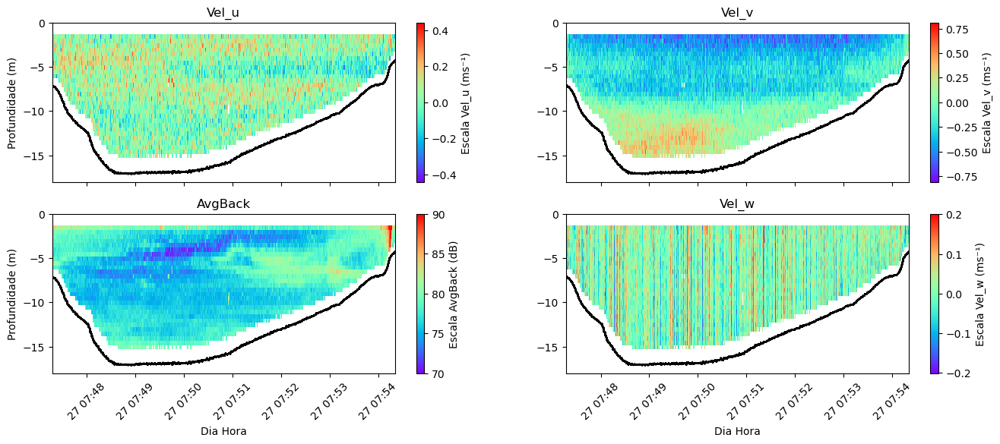

In [38]:
# Cria uma figura com quatro subplots (2x2)
fig, axs = plt.subplots(2, 2, figsize=(16, 6))

# Cria plots de pcolormesh
# Define a normalização de cores para o primeiro subplot (Vel_u)
divnorm_u = TwoSlopeNorm(vmin=-1*ValMax(u_arr), vcenter=0, vmax=ValMax(u_arr))
p1 = axs[0, 0].pcolormesh(X, -Y, u_arr, cmap='rainbow', norm=divnorm_u)

# Define a normalização de cores para o segundo subplot (Vel_v)
divnorm_v = TwoSlopeNorm(vmin=-1*ValMax(v_arr), vcenter=0, vmax=ValMax(v_arr))
p2 = axs[0, 1].pcolormesh(X, -Y, v_arr, cmap='rainbow', norm=divnorm_v)

# Define a normalização de cores para o terceiro subplot (AvgBack)
divnorm_avgB = TwoSlopeNorm(vmin=70, vcenter=80, vmax=90)  # Ajuste conforme necessário
p3 = axs[1, 0].pcolormesh(X, -Y, avgB_arr, cmap='rainbow', norm=divnorm_avgB)

# Define a normalização de cores para o quarto subplot (Vel_w)
divnorm_w = TwoSlopeNorm(vmin=-1*ValMax(w_arr), vcenter=0, vmax=ValMax(w_arr))
p4 = axs[1, 1].pcolormesh(X, -Y, w_arr, cmap='rainbow', norm=divnorm_w)

# Define o rótulo do eixo y para o primeiro e terceiro subplot
axs[0, 0].set_ylabel('Profundidade (m)')
axs[1, 0].set_ylabel('Profundidade (m)')

# Define os títulos dos subplots
titles = ['Vel_u', 'Vel_v', 'AvgBack', 'Vel_w']

# Define os rótulos da barra de cores
cbar_labels = ['Escala Vel_u (ms\u207B\u00B9)', 'Escala Vel_v (ms\u207B\u00B9)', 'Escala AvgBack (dB)', 'Escala Vel_w (ms\u207B\u00B9)']

# Loop sobre os subplots para adicionar detalhes
for i, ax in enumerate(axs.flat):
    # Plota linhas verticais pretas para indicar a profundidade
    ax.plot(X.T, -adcp_df.profundidade.values, 'k')
    # Define o título do subplot
    ax.set_title(titles[i])
    
    # Remove apenas os labels do eixo x na primeira linha, mantendo os ticks
    if i < 2:  # Somente para os subplots da primeira linha (índices 0 e 1)
        ax.set_xticklabels([])  # Remove os rótulos, mas mantém os ticks
    else:
        ax.set_xlabel('Dia Hora')  # Define o rótulo do eixo x na segunda linha
    
    # Define o limite do eixo y
    ax.set_ylim(-18, 0)
    # Rotaciona os rótulos do eixo x na segunda linha
    ax.tick_params(axis='x', labelrotation=45)
    # Adiciona a barra de cores ao subplot
    cbar = fig.colorbar([p1, p2, p3, p4][i], ax=ax, orientation='vertical')
    # Define o rótulo da barra de cores
    cbar.set_label(cbar_labels[i])

# Para salvar a figura apague o '#' abaixo e rode esse código
#plt.savefig("PlotADCP_4SubplotsPreProcess.png", bbox_inches='tight')

# Exibe o gráfico
plt.show()

As componentes de velocidade **u**, **v** e **w** representam, respectivamente, o movimento nas direções horizontal transversal, longitudinal e vertical. A componente **u** refere-se ao fluxo no sentido Leste-Oeste (positiva para o Leste e negativa para o Oeste), **v** descreve o fluxo no sentido do estuário ao Oceano Atlântico (positiva no sentido do estuário e negativa em direção ao Atlântico), e **w** indica o movimento vertical (positiva para cima e negativa para baixo).

#### Dispersão das componentes da velocidade Pré Processadas

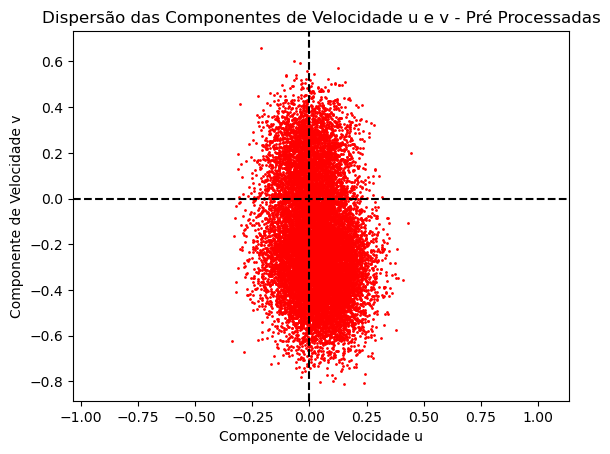

In [41]:
plt.plot(u_arr, v_arr, 'r.', ms=2)

# Configurando o gráfico
plt.axis('equal')
plt.xlabel('Componente de Velocidade u')
plt.ylabel('Componente de Velocidade v')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')

# Adicionando título e legendas
plt.title('Dispersão das Componentes de Velocidade u e v - Pré Processadas')

#plt.savefig("DispersaoADCP_Brutos.png")

# Exibindo o gráfico
plt.show()

# CTD

O software RINKO-Profiler foi utilizado para configurar a taxa de amostragem, acessar os dados armazenados e exportá-los em arquivos de texto simples (.csv), que são usados neste algoritmo.

## Importando Bibliotecas

In [46]:
import pandas as pd  # Biblioteca para manipulação de dados em DataFrames.
import numpy as np  # Biblioteca para operações numéricas, especialmente com arrays.
import re  # Biblioteca para manipulação e processamento de expressões regulares.
import datetime  # Biblioteca para manipulação de datas e tempos.
import pytz  # Biblioteca para trabalhar com fusos horários.

import matplotlib.pyplot as plt  # Biblioteca para criação de gráficos estáticos.
from matplotlib.dates import DateFormatter  # Ferramenta para formatação de datas em gráficos do Matplotlib.
import plotly.express as px  # Biblioteca para criação de gráficos interativos de forma simplificada.
import gsw  # Biblioteca de funções oceanográficas (TEOS-10)

import geopandas as gpd  # Biblioteca para manipulação de dados geoespaciais em estruturas de dados semelhantes a DataFrames.
from shapely.geometry import Point, LineString  # Ferramentas para criar e manipular objetos geométricos como pontos e linhas.
from rasterio.plot import show  # Função para exibir dados rasterizados (imagens geoespaciais).
import rasterio  # Biblioteca para ler e escrever arquivos rasterizados.

import plotly.graph_objects as go  # Ferramenta para criar gráficos interativos personalizados com Plotly.
from plotly.subplots import make_subplots  # Ferramenta para criar subplots (múltiplos gráficos) com Plotly.

from scipy.signal import find_peaks  # Função para detecção de picos em dados, útil para análise de sinais.

### Define caminho dos Arquivos

In [49]:
GPXfile = 'GPS_20210227.gpx'

CTDfile = '202102270755_ASTD152-ALC-R02_0237_075509.Csv'

### Funções

#### Função que carrega e organiza os dados do GPS de mão 

In [53]:
def ler_dados_gpx(caminho_arquivo_gpx):
    """
    Função para processar dados de um arquivo GPX, extraindo latitudes, longitudes e tempo,
    filtrando por área de interesse, removendo dados indesejados, e ajustando o fuso horário.

    Parameters:
    - caminho_arquivo_gpx (str): O caminho completo do arquivo GPX.

    Returns:
    - pd.DataFrame: DataFrame contendo as coordenadas (lat, lon) e o tempo ajustado para o fuso horário local.
    """
    try:
        # Ler o conteúdo do arquivo GPX
        with open(caminho_arquivo_gpx, 'r') as f:
            data = f.read()

        # Extrair latitudes, longitudes e tempo do arquivo GPX
        lat = np.array(re.findall(r'lat="([^"]+)', data), dtype=float)
        lon = np.array(re.findall(r'lon="([^"]+)', data), dtype=float)
        time = re.findall(r'<time>([^\<]+)', data)

        # Filtrar latitudes e longitudes pela área de interesse
        LAT = lat[lat < -32]
        LON = lon[lon < -52]

        # Montar o tempo em UTC
        tempo = [datetime.datetime.strptime(t, "%Y-%m-%dT%H:%M:%SZ").replace(tzinfo=datetime.timezone.utc) for t in time]

        # Juntar as coordenadas com o tempo em um DataFrame
        gps_df = pd.DataFrame({'lat': LAT, 'lon': LON, 'tempo': tempo})

        # Remover dados do dia 25/02/2021
        gps_df = gps_df[gps_df['tempo'].dt.date != datetime.date(2021, 2, 25)]

        # Converter o fuso horário de UTC para Local
        tz_SP = pytz.timezone('America/Sao_Paulo')
        gps_df['tempo'] = gps_df['tempo'].dt.tz_convert(tz_SP)

        # Remover a primeira linha que possui dados ruins
        gps_df.drop(0, inplace=True)

        # Resetar o índice
        gps_df.reset_index(drop=True, inplace=True)

        return gps_df

    except Exception as e:
        print(f"Erro ao processar o arquivo GPX: {e}")
        return None

#### Função que carrega e organiza os dados de CTD

In [56]:
def ler_dados_ctd(caminho_arquivo):
    """
    Função para ler e processar os dados de um arquivo CTD em formato CSV.

    Parameters:
    - caminho_arquivo (str): O caminho completo do arquivo CSV.

    Returns:
    - pd.DataFrame: DataFrame contendo os dados do CTD processados e filtrados.
    """

    try:
        # Definir a string que indica o início dos dados
        string_inicio_dados = '[Item]\n'

        # Ler o arquivo CSV como uma lista de strings
        with open(caminho_arquivo, 'r') as f:
            linhas = f.readlines()

        # Encontrar o índice da linha que contém a string de início dos dados
        indice_inicio_dados = linhas.index(string_inicio_dados)

        # Novos nomes das colunas
        colunas_novas = [
            'tempo', 'pressao', 'temperatura', 'salinidade', 'condutividade', 
            'ec', 'densidade', 'sigmat', 'chlflu', 'chla', 'turbidez', 
            'do%', 'domgl', 'dommoll', 'bateria'
        ]

        # Ler o arquivo CSV a partir da linha com os nomes das colunas
        ctd_df = pd.read_csv(caminho_arquivo, header=indice_inicio_dados+1, sep=',', index_col=False, names=colunas_novas)

        # Ajuste do tipo de dados da coluna 'tempo'
        ctd_df['tempo'] = pd.to_datetime(ctd_df['tempo'])

        # Definir o fuso horário desejado
        tz_SP = 'America/Sao_Paulo'

        # Adicionar a informação de fuso horário ao tempo de CTD
        ctd_df['tempo'] = ctd_df['tempo'].dt.tz_localize(tz=None)  # Removendo o fuso horário existente (se houver)
        ctd_df['tempo'] = ctd_df['tempo'].dt.tz_localize(tz_SP)  # Definindo o fuso horário desejado

        # Remover colunas não utilizadas
        colunas_remover = [
            'condutividade', 'ec', 'densidade', 'sigmat', 'chlflu', 
            'chla', 'do%', 'domgl', 'dommoll', 'bateria'
        ]
        ctd_df = ctd_df.drop(columns=colunas_remover)

        # Retornar o DataFrame processado
        return ctd_df

    except Exception as e:
        print(f"Erro ao processar o arquivo CTD: {e}")
        return None

#### Função que ajusta o incremento do tempo nos dados de CTD

In [59]:
def ajustar_indice_temporal(ctd_df):
    """
    Ajusta o índice temporal de um DataFrame para criar novos timestamps, garantindo um incremento adequado
    no tempo, refletindo a taxa amostral de 10Hz dos dados de CTD. Este ajuste é necessário porque o tempo original
    estava sendo registrado apenas até os segundos, sem capturar corretamente os milissegundos correspondentes
    à taxa amostral.

    Parâmetros:
        ctd_df (pd.DataFrame): DataFrame contendo uma coluna de tempo que será usada como índice.

    Retorna:
        pd.DataFrame: DataFrame com o índice temporal ajustado.
    """
    # Definir a coluna 'tempo' como índice
    ctd_df.set_index('tempo', inplace=True)
    
    primeira_ocorrencia = None
    numero_ocorrencias = []
    contador = 0

    # Contar o número de ocorrências de cada tempo
    for idx in ctd_df.index:
        if primeira_ocorrencia is None or idx != primeira_ocorrencia:
            numero_ocorrencias.append(contador)
            primeira_ocorrencia = idx
            contador = 1
        else:
            contador += 1

    # Ajustar a lista para corresponder ao número de ocorrências
    numero_ocorrencias = numero_ocorrencias[1:]
    numero_ocorrencias.append(contador)

    novo_indice = []

    # Criar novo índice temporal com base nas ocorrências
    for i, tempo_unico in enumerate(ctd_df.index.unique()):
        incremento_tempo = pd.Timedelta(0) if numero_ocorrencias[i] == 10 else pd.Timedelta(100000000 * numero_ocorrencias[i])
        
        for j in range(numero_ocorrencias[i]):
            novo_indice.append(tempo_unico + incremento_tempo)
            incremento_tempo += pd.Timedelta(milliseconds=100)
    
    # Verificar se o tamanho do novo índice corresponde ao tamanho do DataFrame original
    if len(novo_indice) != len(ctd_df):
        raise ValueError("O novo índice gerado não corresponde ao tamanho do DataFrame original.")
    
    # Converter a lista de timestamps em um objeto pandas Datetime e ajustar o índice do DataFrame
    datetime_indice = pd.to_datetime(novo_indice)
    ctd_df.index = pd.Index(datetime_indice, name='tempo')
    ctd_df.reset_index(inplace=True)
    
    return ctd_df

#### Função que sincroniza temporalmente os dados de CTD e GPS

In [62]:
def sincronizar_e_interpolar_gps(gps_df, ctd_df):
    """
    Sincroniza e interpola os dados de GPS para corresponder ao intervalo de tempo dos dados de CTD.

    Parâmetros:
        gps_df (pd.DataFrame): DataFrame contendo os dados de GPS com uma coluna de tempo.
        ctd_df (pd.DataFrame): DataFrame contendo os dados de CTD com uma coluna de tempo.

    Retorna:
        pd.DataFrame: DataFrame resultante da mesclagem dos dados de GPS interpolados e CTD.
    """
    # Definir a coluna 'tempo' como índice em ambos os DataFrames
    gps_df.set_index('tempo', inplace=True)
    ctd_df.set_index('tempo', inplace=True)

    # Reamostrar o DataFrame de GPS para 10Hz (a cada 0,1 segundos)
    gps_df_resampled = gps_df.resample('0.1S').asfreq()

    # Interpolar o DataFrame de GPS reamostrado
    gps_df_interp = gps_df_resampled.interpolate(method='linear')

    # Obter os tempos de início e fim dos dados de CTD
    start_datetime = ctd_df.index.min()
    end_datetime = ctd_df.index.max()

    # Filtrar os dados de GPS para corresponder ao intervalo de tempo dos dados de CTD
    gps_df_sliced = gps_df_interp.loc[start_datetime:end_datetime]

    # Redefinir o índice de ambos os DataFrames
    gps_df_sliced.reset_index(inplace=True)
    ctd_df.reset_index(inplace=True)

    # Mesclar os DataFrames com base na coluna de tempo
    dados_df = pd.merge(ctd_df, gps_df_sliced, on='tempo')

    return dados_df

#### Conjunto de funções que extrai os perfis de descida, ajustando o tempo, corrigindo as coordenadas, removendo trechos de subida, removendo meio metro do fundo e medições duplicadas

In [65]:
def encontrar_vales(profundidade, prominencia=1, min_distancia=25):
    """
    Encontra os vales nos dados de profundidade invertida.

    Parâmetros:
        profundidade (pd.Series): Série com os dados de profundidade.
        prominencia (float): Proeminência mínima dos picos. A proeminência mede quão destacado um pico (ou vale, no caso da profundidade invertida)
                             é em relação aos seus arredores. Somente vales com proeminência maior ou igual ao valor especificado serão considerados.
        min_distancia (int): Distância mínima entre vales para manter.

    Retorna:
        np.ndarray: Índices dos vales.
    """
    inv_profundidade = -profundidade  # Invertendo a profundidade para encontrar os vales
    vales, _ = find_peaks(inv_profundidade, prominence=prominencia)
    
    indices_a_eliminar = []

    # Eliminar vales muito próximos
    for i in range(1, len(vales)):
        if abs(vales[i] - vales[i - 1]) < min_distancia:
            indices_a_eliminar.append(i)

    # Remover os vales excedentes
    vales_filtrados = np.delete(vales, indices_a_eliminar)
    
    return vales_filtrados

def encontrar_gaps(indices, limite=50):
    """
    Encontra os gaps nos dados com base nas diferenças entre índices consecutivos.

    Parâmetros:
        indices (np.ndarray): Array de índices dos dados.
        limite (int): Diferença mínima entre índices consecutivos para considerar um gap.

    Retorna:
        np.ndarray: Índices onde ocorrem gaps.
    """
    diff_values = np.diff(indices)
    diff_maiorq_limite = np.where(diff_values > limite)[0] + 1
    gaps = np.concatenate(([0], diff_maiorq_limite))
    
    return gaps

def separar_perfis_descida(ctd_df, gaps, vales):
    """
    Separa os perfis de descida dos dados de CTD usando os índices dos gaps e dos vales como referência.

    Parâmetros:
        ctd_df (pd.DataFrame): DataFrame contendo os dados de CTD.
        gaps (np.ndarray): Índices onde ocorrem gaps.
        vales (np.ndarray): Índices dos vales.

    Retorna:
        list: Lista de DataFrames, cada um representando um perfil de descida.
    """
    perfis_descida = []
    for g, v in zip(gaps, vales):
        perfis_descida.append(ctd_df.iloc[g:v]) # Reproduz exatamente a lógica original
    
    return perfis_descida

def retirar_meio_metro_fundo(perfis_descida, threshold=0.5):
    """
    Retira meio metro do fundo de cada perfil de descida.

    Parâmetros:
        perfis_descida (list): Lista de DataFrames contendo os perfis de descida.
        threshold (float): Valor em metros a ser retirado do fundo de cada perfil.

    Retorna:
        list: Lista de DataFrames atualizados com meio metro retirado do fundo.
    """
    for i, df in enumerate(perfis_descida):
        max_depth = df['profundidade'].min()
        new_threshold = max_depth + threshold
        perfis_descida[i] = df[df['profundidade'] >= new_threshold]
    
    return perfis_descida

def corrigir_coordenadas_e_filtrar_perfis(perfis_descida):
    """
    Corrige as coordenadas de cada perfil de descida e filtra para remover trechos de subida e medições duplicadas.

    Parâmetros:
        perfis_descida (list): Lista de DataFrames contendo os perfis de descida.

    Retorna:
        list: Lista de DataFrames corrigidos e filtrados.
    """
    perfis_corrigidos = []
    for df in perfis_descida:
        # Criar uma cópia explícita do DataFrame para evitar o SettingWithCopyWarning
        df_corrigido = df.copy()

        # Repetir o primeiro par de coordenadas para todas as linhas do DataFrame
        first_lat = df_corrigido['lat'].iloc[0]
        first_lon = df_corrigido['lon'].iloc[0]
        df_corrigido['lat'] = first_lat
        df_corrigido['lon'] = first_lon

        # Remover trechos de subida e medições duplicadas
        df_corrigido = df_corrigido[df_corrigido['profundidade'].diff() <= 0]
        df_corrigido.drop_duplicates(subset=['profundidade'], inplace=True)

        perfis_corrigidos.append(df_corrigido)
    
    return perfis_corrigidos


# Função principal para organizar o fluxo de trabalho
def processar_perfis_descida(ctd_df):
    """
    Processa os perfis de descida de um DataFrame de CTD, retirando meio metro do fundo e corrigindo as coordenadas.

    Parâmetros:
        ctd_df (pd.DataFrame): DataFrame contendo os dados de CTD.

    Retorna:
        list: Lista de DataFrames contendo os perfis de descida processados.
    """
    vales = encontrar_vales(ctd_df['profundidade'])
    gaps = encontrar_gaps(ctd_df.index.values)
    perfis_descida = separar_perfis_descida(ctd_df, gaps, vales)
    perfis_descida = retirar_meio_metro_fundo(perfis_descida)
    perfis_descida = corrigir_coordenadas_e_filtrar_perfis(perfis_descida)
    
    return perfis_descida

## Leitura do arquivo GPX

In [68]:
gps_df = ler_dados_gpx(GPXfile)

# Visualização dos primeiros registros do DataFrame
print("Dados GPS:")
display(gps_df.head())

Dados GPS:


,lat,lon,tempo
0,-32.136324,-52.102307,2021-02-26 07:54:17-03:00
1,-32.136302,-52.102142,2021-02-26 07:54:22-03:00
2,-32.136332,-52.102094,2021-02-26 07:54:28-03:00
3,-32.136321,-52.101962,2021-02-26 07:54:33-03:00
4,-32.136319,-52.101864,2021-02-26 07:54:38-03:00


#### Visualizando dados do GPS de mão

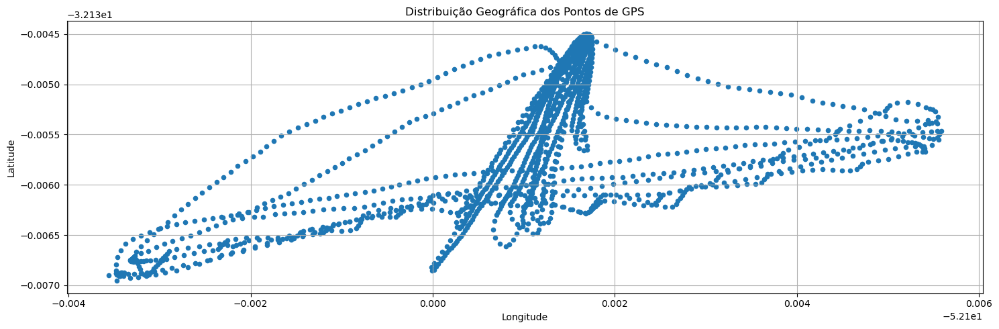

In [71]:
# Seu código para plotar o gráfico
ax = gps_df.plot.scatter(x='lon', y='lat', figsize=(15, 5))

# Adiciona título e legendas
ax.set_title('Distribuição Geográfica dos Pontos de GPS')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Adiciona grade e ajusta o layout
plt.grid()
plt.tight_layout()

#plt.savefig("PontosGPS.png")

# Mostra o gráfico
plt.show()


## Leitura do arquivo CSV de CTD

In [74]:
ctd_df = ler_dados_ctd(CTDfile)

# Visualização dos primeiros registros do DataFrame
print("Dados CTD:")
display(ctd_df.head())

Dados CTD:


,tempo,pressao,temperatura,salinidade,turbidez
0,2021-02-27 07:55:15-03:00,-1.245,24.985,0.015,1.57
1,2021-02-27 07:55:15-03:00,-1.245,24.990,0.015,1.46
2,2021-02-27 07:55:15-03:00,-1.245,24.990,0.015,2.37
3,2021-02-27 07:55:15-03:00,-1.245,24.989,0.015,3.13
4,2021-02-27 07:55:15-03:00,-1.245,24.984,0.015,3.08


### Visualizando os perfis verticais pré processados

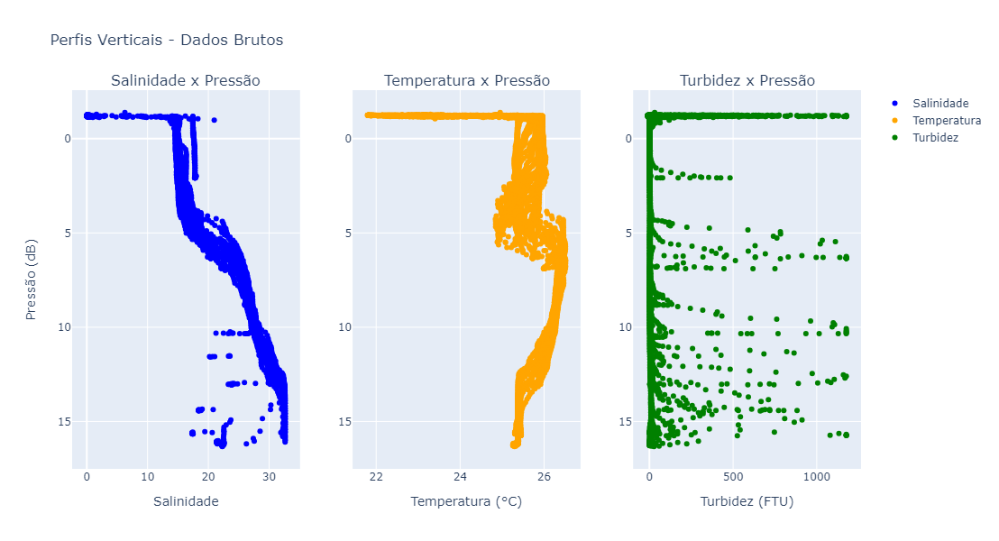

In [77]:
# Criar subplots
fig = make_subplots(rows=1, cols=3, shared_yaxes=True, subplot_titles=('Salinidade x Pressão', 'Temperatura x Pressão', 'Turbidez x Pressão'))

# Adicionar perfil de salinidade x pressão
fig.add_trace(go.Scatter(x=ctd_df['salinidade'], y=ctd_df['pressao'], mode='markers', name='Salinidade',
                         line=dict(color='blue')), row=1, col=1)
fig.update_xaxes(title_text="Salinidade", row=1, col=1)
fig.update_yaxes(title_text="Pressão (dB)", autorange="reversed", row=1, col=1)

# Adicionar perfil de temperatura x pressão
fig.add_trace(go.Scatter(x=ctd_df['temperatura'], y=ctd_df['pressao'], mode='markers', name='Temperatura',
                         line=dict(color='orange')), row=1, col=2)
fig.update_xaxes(title_text="Temperatura (°C)", row=1, col=2)
fig.update_yaxes(autorange="reversed", showticklabels=True, row=1, col=2)

# Adicionar perfil de turbidez x pressão
fig.add_trace(go.Scatter(x=ctd_df['turbidez'], y=ctd_df['pressao'], mode='markers', name='Turbidez',
                         line=dict(color='green')), row=1, col=3)
fig.update_xaxes(title_text="Turbidez (FTU)", row=1, col=3)
fig.update_yaxes(autorange="reversed", showticklabels=True, row=1, col=3)

# Atualizar layout do gráfico
fig.update_layout(height=600, autosize=True, title_text="Perfis Verticais - Dados Brutos")

# Mostrar o gráfico
fig.show()

## Corrigindo Pressão

In [80]:
# Valor mínimo deveria ser próximo de zero, logo será corrigido
correcao = ctd_df.pressao.min()
ctd_original = ctd_df.copy()

# Aplicando a correção da pressão
if ctd_df.pressao.min() < 0:
    ctd_df['pressao'] = ctd_df['pressao'] - correcao

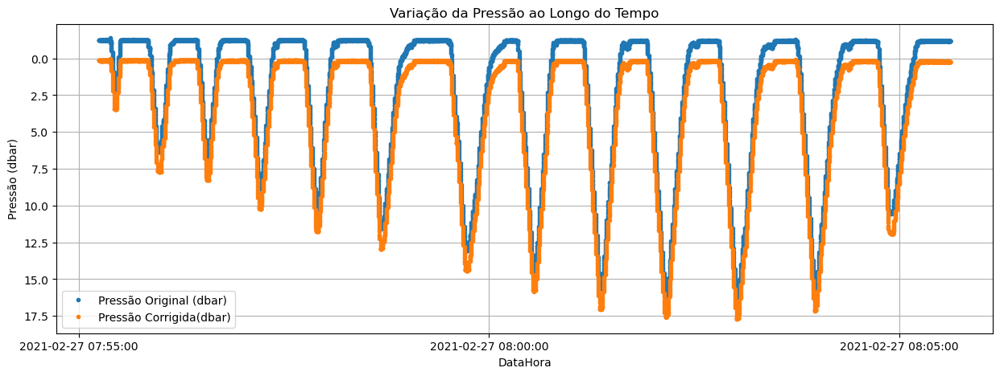

In [82]:
plt.figure(figsize=(15, 5))

plt.plot(ctd_original['tempo'].values-3, ctd_original['pressao'].values, marker='.', linestyle=' ', label='Pressão Original (dbar)')

plt.plot(ctd_df['tempo'].values-3, ctd_df['pressao'].values, marker='.', linestyle=' ', label='Pressão Corrigida(dbar)')

# Adicionando título e rótulos dos eixos
plt.title('Variação da Pressão ao Longo do Tempo')
plt.xlabel('DataHora')
plt.ylabel('Pressão (dbar)')

# Formata o eixo x para mostrar as horas no fuso horário definido
date_formatter = DateFormatter('%Y-%m-%d %H:%M:%S', tz=pytz.timezone('America/Sao_Paulo'))
plt.gca().xaxis.set_major_formatter(date_formatter)

# Invertendo eixo y
plt.gca().invert_yaxis()
# Adicionando legenda
plt.legend()
# Adiciona o grid
plt.grid()

#plt.savefig("CorrecaoPressaoCTD.png")
# Mostrando o gráfico
plt.show()

## Sincronizando GPS e CTD temporalmente

In [85]:
# Primeiro, ajuste o índice temporal do DataFrame de CTD
ctd_df_ajustado = ajustar_indice_temporal(ctd_df)

In [86]:
# Em seguida, sincroniza os dados de GPS com os dados de CTD
ctd_sinc = sincronizar_e_interpolar_gps(gps_df, ctd_df_ajustado)

In [87]:
ctd_sinc.head()

,tempo,pressao,temperatura,salinidade,turbidez,lat,lon
0,2021-02-27 07:55:15.500000-03:00,0.144,24.985,0.015,1.57,-32.135247,-52.094524
1,2021-02-27 07:55:15.600000-03:00,0.144,24.990,0.015,1.46,-32.135246,-52.094525
2,2021-02-27 07:55:15.700000-03:00,0.144,24.990,0.015,2.37,-32.135246,-52.094525
3,2021-02-27 07:55:15.800000-03:00,0.144,24.989,0.015,3.13,-32.135246,-52.094526
4,2021-02-27 07:55:15.900000-03:00,0.144,24.984,0.015,3.08,-32.135246,-52.094526


In [91]:
ctd_sinc['tempo'] = pd.to_datetime(ctd_sinc['tempo'])

# Convertendo 'tempo' para numpy array
ctd_sinc['tempo_str'] = np.array(ctd_sinc['tempo'].dt.strftime('%Y-%m-%d %H:%M:%S'))

In [92]:
ctd_sinc.head()

,tempo,pressao,temperatura,salinidade,turbidez,lat,lon,tempo_str
0,2021-02-27 07:55:15.500000-03:00,0.144,24.985,0.015,1.57,-32.135247,-52.094524,2021-02-27 07:55:15
1,2021-02-27 07:55:15.600000-03:00,0.144,24.990,0.015,1.46,-32.135246,-52.094525,2021-02-27 07:55:15
2,2021-02-27 07:55:15.700000-03:00,0.144,24.990,0.015,2.37,-32.135246,-52.094525,2021-02-27 07:55:15
3,2021-02-27 07:55:15.800000-03:00,0.144,24.989,0.015,3.13,-32.135246,-52.094526,2021-02-27 07:55:15
4,2021-02-27 07:55:15.900000-03:00,0.144,24.984,0.015,3.08,-32.135246,-52.094526,2021-02-27 07:55:15


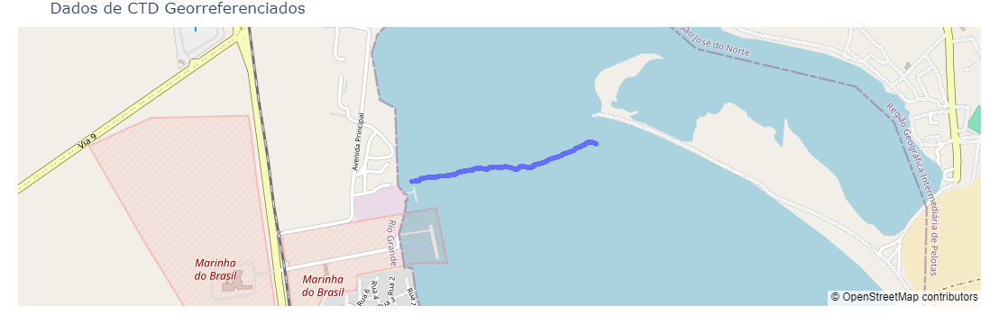

In [94]:
fig = px.scatter_mapbox(ctd_sinc, lat="lat", lon="lon", hover_name='tempo_str', zoom=14, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":20, "t":30, "l":20, "b":20},
                  title=("Dados de CTD Georreferenciados"))
fig.show()

## Calculando a profundidade a partir da pressão e da latitude média

In [98]:
#Convertendo pressão em profundidade
ctd_sinc.insert(2, 'profundidade', (gsw.z_from_p(ctd_sinc.pressao, ctd_sinc.lat.mean())))

In [99]:
ctd_sinc.head()

,tempo,pressao,profundidade,temperatura,salinidade,turbidez,lat,lon,tempo_str
0,2021-02-27 07:55:15.500000-03:00,0.144,-0.142995,24.985,0.015,1.57,-32.135247,-52.094524,2021-02-27 07:55:15
1,2021-02-27 07:55:15.600000-03:00,0.144,-0.142995,24.990,0.015,1.46,-32.135246,-52.094525,2021-02-27 07:55:15
2,2021-02-27 07:55:15.700000-03:00,0.144,-0.142995,24.990,0.015,2.37,-32.135246,-52.094525,2021-02-27 07:55:15
3,2021-02-27 07:55:15.800000-03:00,0.144,-0.142995,24.989,0.015,3.13,-32.135246,-52.094526,2021-02-27 07:55:15
4,2021-02-27 07:55:15.900000-03:00,0.144,-0.142995,24.984,0.015,3.08,-32.135246,-52.094526,2021-02-27 07:55:15


## Filtrar os dados para retirar profundidades menores que 0,5 metros

In [103]:
# Filtrar as linhas com profundidade menor ou igual a meio metro
ctd_sinc_st = ctd_sinc[ctd_sinc['profundidade'] < -0.5]

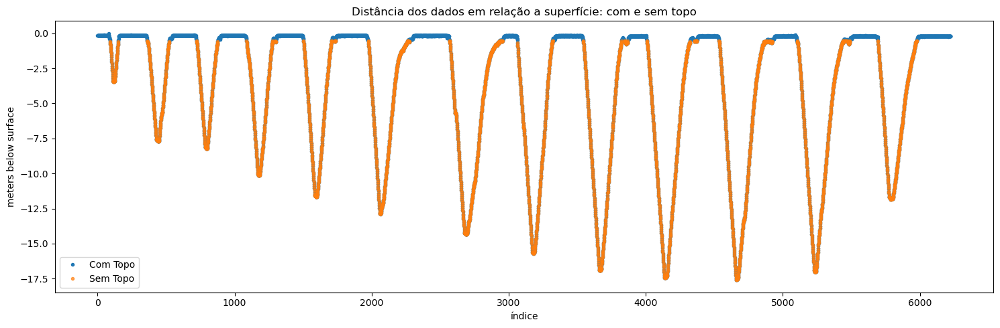

In [104]:
ctd_sinc.profundidade.plot(title='Distância dos dados em relação a superfície: com e sem topo', figsize=(15,5), marker='.', linestyle='', label='Com Topo');
ctd_sinc_st.profundidade.plot(marker='.', linestyle='', alpha=0.7, label='Sem Topo');
plt.legend()
plt.ylabel('meters below surface')
plt.xlabel('índice')
plt.tight_layout()

#plt.savefig("RetiradaTopo.png")

## Separando os perfis de descida, retirando meio metro do fundo e corrigindo as coordenadas
Os dados do CTD possuem um par de coordenadas por ponto, mas, para corrigir a distorção causada pelo movimento horizontal do barco durante a queda livre do CTD, apenas o primeiro par de coordenadas será vinculado a cada perfil de descida. Isso ajusta a representação dos dados, eliminando a impressão de que o CTD desceu diagonalmente pela coluna d'água.

Também serão retirados os dados de subida em meio aos perfis de descida. Os dados da subida são descartados devido à turbulência gerada pelo movimento do instrumento, que compromete a precisão das medições. Além disso, a descida oferece maior estabilidade, com melhor resposta dos sensores e menor distorção causada pela aceleração, resultando em dados mais confiáveis.

### Automatizando a separação:

A separação dos perfis de descida dos de subida foi automatizada utilizando os gaps (intervalos sem dados, conforme ilustrado na figura acima, linha 'Sem Topo') para distinguir os pares de perfis (descida e subida) uns dos outros. Os vales (pontos de maior profundidade) foram utilizados para separar os perfis dentro de cada par, identificando o momento de transição entre a descida e a subida.

In [110]:
perfis_descida = processar_perfis_descida(ctd_sinc_st)

## Dataframe dos perfis de descida (CTD)

In [113]:
# União dos DataFrames da lista perfis_descida em um único DataFrame
df_descida = pd.concat(perfis_descida, ignore_index=True)

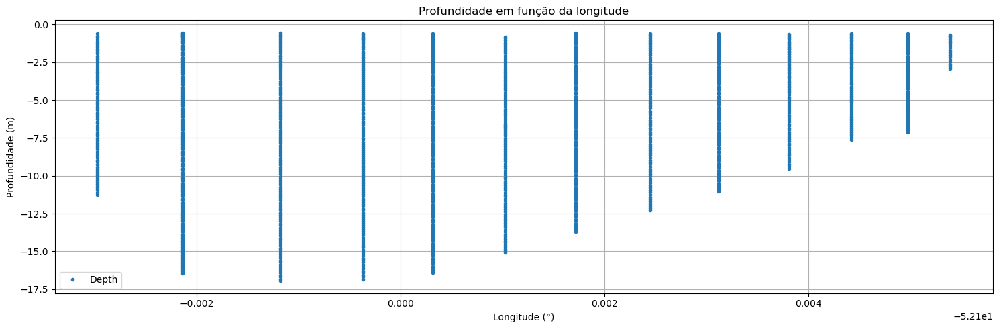

In [115]:
plt.figure(figsize=(15,5))
plt.plot(df_descida.lon.values, df_descida['profundidade'].values, label='Depth', marker='.', linestyle='')

plt.xlabel('Longitude (°)')
plt.ylabel('Profundidade (m)')
plt.title('Profundidade em função da longitude')
plt.legend()
plt.tight_layout()
plt.grid()

#plt.savefig("ProfXLong.png")

plt.show()

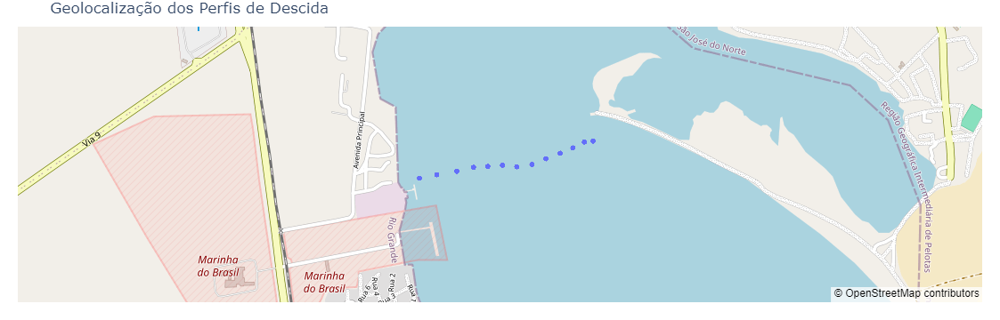

In [117]:
# Convertendo a coluna 'tempo' para strings formatadas
df_descida['tempo_str'] = df_descida['tempo'].dt.strftime('%Y-%m-%d %H:%M:%S')

# Criando o scatter mapbox usando a coluna formatada como hover_name
fig = px.scatter_mapbox(df_descida, lat="lat", lon="lon", hover_name='tempo_str', zoom=14, height=300)

# Atualizando o estilo do mapa e layout
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    margin={"r": 20, "t": 30, "l": 20, "b": 20},
    title="Geolocalização dos Perfis de Descida"
)

# Exibindo o gráfico
fig.show()

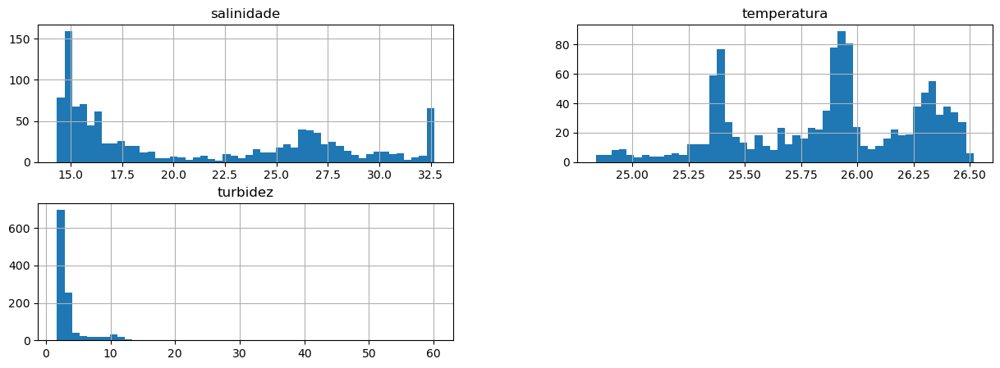

In [119]:
# Histograma dos dados de CTD
df_descida.hist(column=['salinidade', 'temperatura', 'turbidez'], figsize=(15,5), bins=50);
# plt.savefig('histogramaCTD.png')

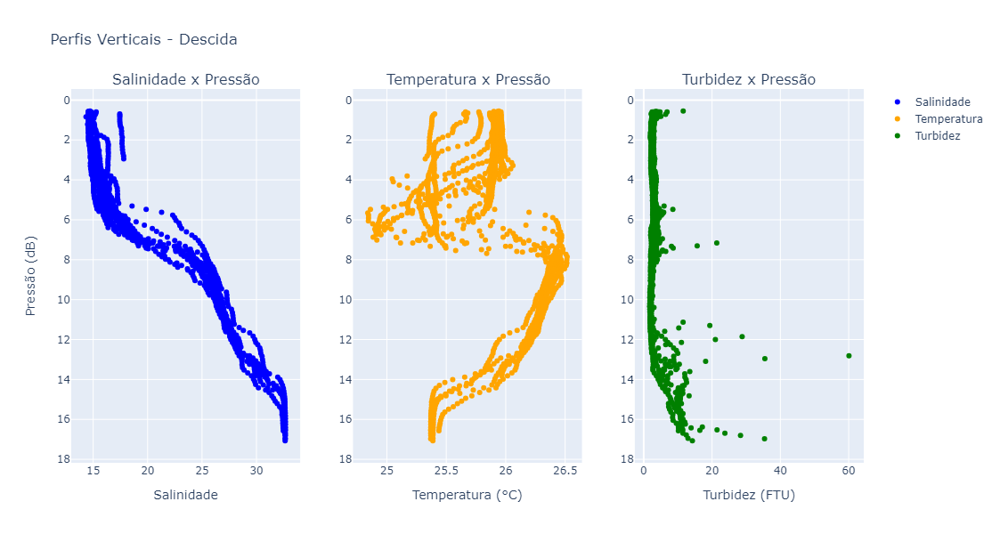

In [121]:
# Criar subplots
fig = make_subplots(rows=1, cols=3, shared_yaxes=True, subplot_titles=('Salinidade x Pressão', 'Temperatura x Pressão', 'Turbidez x Pressão'))

# Adicionar perfil de salinidade x pressão
fig.add_trace(go.Scatter(x=df_descida['salinidade'], y=df_descida['pressao'], mode='markers', name='Salinidade',
                         marker=dict(color='blue')), row=1, col=1)
fig.update_xaxes(title_text="Salinidade", row=1, col=1)
fig.update_yaxes(title_text="Pressão (dB)", autorange="reversed", row=1, col=1)

# Adicionar perfil de temperatura x pressão
fig.add_trace(go.Scatter(x=df_descida['temperatura'], y=df_descida['pressao'], mode='markers', name='Temperatura',
                         marker=dict(color='orange')), row=1, col=2)
fig.update_xaxes(title_text="Temperatura (°C)", row=1, col=2)
fig.update_yaxes(autorange="reversed", showticklabels=True, row=1, col=2)

# Adicionar perfil de turbidez x pressão
fig.add_trace(go.Scatter(x=df_descida['turbidez'], y=df_descida['pressao'], mode='markers', name='Turbidez',
                         marker=dict(color='green')), row=1, col=3)
fig.update_xaxes(title_text="Turbidez (FTU)", row=1, col=3)
fig.update_yaxes(autorange="reversed", showticklabels=True, row=1, col=3)

# Atualizar layout do gráfico
fig.update_layout(height=600, autosize=True, title_text="Perfis Verticais - Descida")

# Mostrar o gráfico
fig.show()

# Sincronizando Espacialmente - ADCP e CTD

## Importando Bibliotecas

In [125]:
from shapely.geometry import Point, LineString
# Shapely é uma biblioteca utilizada para manipular e analisar geometria em Python.
# 'Point' e 'LineString' são classes que representam objetos geométricos.
# 'Point' é usado para criar e manipular pontos no espaço bidimensional (x, y).
# 'LineString' é usado para criar e manipular linhas, que são sequências de pontos conectados.

from sklearn.linear_model import LinearRegression
# Scikit-learn é uma biblioteca popular para aprendizado de máquina em Python.
# 'LinearRegression' é uma classe usada para realizar regressão linear, uma técnica estatística
# que modela a relação entre uma variável dependente e uma ou mais variáveis independentes.
# É usada em problemas de regressão, onde o objetivo é prever valores contínuos.

from matplotlib_scalebar.scalebar import ScaleBar
# Matplotlib Scalebar é uma extensão do Matplotlib que permite adicionar uma barra de escala (ScaleBar)
# a gráficos ou imagens, indicando a relação de escala. 
# 'ScaleBar' é uma classe usada para criar e adicionar barras de escala a visualizações, como mapas ou
# imagens, facilitando a compreensão da distância ou proporção no gráfico.

from scipy.interpolate import griddata
# 'griddata' é uma função da biblioteca SciPy usada para interpolar pontos irregulares em um grid regular.
# Essa função é útil para estimar valores em pontos onde não há dados, baseando-se em vizinhos conhecidos.
# É frequentemente usada em problemas que envolvem geolocalização ou superfícies complexas.

from scipy.interpolate import interp1d
# 'interp1d' é uma função da SciPy que realiza interpolação unidimensional.
# Ela permite criar uma função contínua baseada em dados discretos, útil para encontrar valores
# intermediários entre dois pontos de dados conhecidos. A interpolação pode ser linear, cúbica, entre outros tipos.
# A interpolação padrão é a linear, e é também a que foi utiilizada.

## Funções

#### Função que extrai as coordenadas únicas de dois dataframes e retorna como uma tupla

In [128]:
def extrair_coordenadas_unicas(df_descida, adcp_df):
    """
    Extrai as coordenadas únicas (latitude e longitude) dos dados de CTD e ADCP,
    combinando-as em arrays numpy separados.

    Parâmetros:
        df_descida (pd.DataFrame): DataFrame contendo os dados de CTD com colunas 'lat' e 'lon'.
        adcp_df (pd.DataFrame): DataFrame contendo os dados de ADCP com colunas 'latitude' e 'longitude'.

    Retorna:
        tuple: Uma tupla contendo dois arrays numpy:
            - adcp_coords (np.ndarray): Array de coordenadas do ADCP.
            - ctd_coords (np.ndarray): Array de coordenadas do CTD.
    """
    # Extraindo valores únicos das colunas lat e lon dos dados de CTD
    unique_lats_ctd = df_descida['lat'].unique()
    unique_lons_ctd = df_descida['lon'].unique()

    # Combinando lat e lon em um array numpy organizado
    ctd_coords = np.array([[lat, lon] for lat, lon in zip(unique_lats_ctd, unique_lons_ctd)])

    # Extraindo valores das colunas lat e lon dos dados de ADCP (assume-se que já são únicos)
    unique_lats_adcp = adcp_df['latitude']
    unique_lons_adcp = adcp_df['longitude']

    # Combinando lat e lon em um array numpy organizado
    adcp_coords = np.array([[lat, lon] for lat, lon in zip(unique_lats_adcp, unique_lons_adcp)])

    # Retornando uma tupla com os arrays de coordenadas
    return adcp_coords, ctd_coords

#### Função para calcular a regressão linear ponderada, retornando seus componentes

In [132]:
def calcular_regressao_linear_ponderada(coords_adcp, coords_ctd):
    """
    Realiza uma regressão linear ponderada das coordenadas de ADCP e CTD, replicando as coordenadas de CTD 
    para equilibrar o número de pontos, e projeta um ponto de referência afastado.

    Parâmetros:
        coords_adcp (np.ndarray): Array numpy 2D contendo coordenadas de ADCP (latitude, longitude).
        coords_ctd (np.ndarray): Array numpy 2D contendo coordenadas de CTD (latitude, longitude).

    Retorna:
        tuple: Contendo:
            - coeficiente_angular (float): Inclinação da linha de regressão.
            - intercepto (float): Intercepto da linha de regressão.
            - lon_proj (float): Longitude projetada do ponto de referência.
            - lat_proj (float): Latitude projetada do ponto de referência.
            - conversao (float): Fator de conversão para transformar a diferença de longitude em quilômetros na latitude média.
    """
    # Calcular o fator de replicação
    fator_replicacao = len(coords_adcp) // len(coords_ctd)

    # Replicar os pontos de CTD
    coords_ctd_replicados = np.repeat(coords_ctd, fator_replicacao, axis=0)

    # Combinar pontos de ADCP e CTD replicados
    coords_ponderadas = np.vstack((coords_adcp, coords_ctd_replicados))

    # Extrair longitude e latitude do array combinado
    longitudes = coords_ponderadas[:, 1]  # Longitude
    latitudes = coords_ponderadas[:, 0]  # Latitude

    # Latitude média como referência para o ponto projetado
    lat_ref = np.mean(latitudes)

    # Fator de conversão para longitude em quilômetros na latitude média
    conversao = 111.12 * np.cos(np.radians(lat_ref))

    # Realizar regressão linear ponderada
    modelo = LinearRegression()
    modelo.fit(longitudes.reshape(-1, 1), latitudes)

    coeficiente_angular = modelo.coef_[0]
    intercepto = modelo.intercept_

    # Escolher um ponto de referência afastado
    lon_proj = longitudes.min() - 2/conversao  # Aproximadamente 2 km a oeste
    lat_proj = intercepto + coeficiente_angular * lon_proj  # Latitude correspondente usando o modelo linear

    return coeficiente_angular, intercepto, lon_proj, lat_proj, conversao, longitudes, latitudes

#### Função que calcula as distâncias euclidianas em metros entre um conjunto de coordenadas e um ponto de referência projetado, ajustando essas distâncias para serem relativas ao primeiro ponto da série, separando os resultados para os dados de ADCP e CTD.

In [134]:
def calcular_distancias_relativas(adcp_coords, ctd_coords, lon_proj, lat_proj, conversao):
    """
    Calcula as distâncias euclidianas em metros entre as coordenadas fornecidas e um ponto de referência,
    ajustando-as para serem relativas ao primeiro ensemble.

    Parâmetros:
        adcp_coords (np.ndarray): Array numpy 2D contendo as coordenadas de ADCP.
        ctd_coords (np.ndarray): Array numpy 2D contendo as coordenadas de CTD.
        lon_proj (float): Longitude do ponto de referência projetado.
        lat_proj (float): Latitude do ponto de referência projetado.
        conversao (float): Fator de conversão para transformar a diferença de longitude em quilômetros.

    Retorna:
        tuple: Contendo dois arrays numpy:
            - distancia_adcp (np.ndarray): Distâncias calculadas para os pontos de ADCP em metros.
            - distancia_ctd (np.ndarray): Distâncias calculadas para os pontos de CTD em metros.
    """
    # Empilhando verticalmente os arrays
    all_coords = np.vstack((adcp_coords, ctd_coords))
    
    # Calcular as diferenças em longitude e latitude em relação ao ponto de referência
    dx = all_coords[:, 1] - lon_proj
    dy = all_coords[:, 0] - lat_proj

    # Calcular a distância euclidiana em quilômetros usando o fator de conversão
    distancia_km = np.sqrt(dx**2 + dy**2) * conversao

    # Ajustar distâncias para serem relativas ao primeiro ensemble e converter para metros
    distancia_total = (distancia_km - np.min(distancia_km)) * 1000

    # Número de pontos de ADCP e CTD
    num_adcp = adcp_coords.shape[0]
    num_ctd = ctd_coords.shape[0]

    # Separar as distâncias calculadas para ADCP e CTD
    distancia_adcp = distancia_total[:num_adcp]
    distancia_ctd = distancia_total[num_adcp:num_adcp + num_ctd]

    return distancia_adcp, distancia_ctd

#### Função que calcula a média por intervalos de distância (ADCP)

In [136]:
def calcular_media_por_distancia(distancias, arr, d_dist):
    """
    Calcula a média do array fornecido para cada intervalo de distância.

    Parâmetros:
        distancias (ndarray): Array unidimensional contendo os valores de distância, em metros.
        arr (ndarray): Array multidimensional (nivels x ensemble) contendo os dados para os quais a média será calculada.
        d_dist (float): Intervalo de distância para a média, em metros.
    
    Retorna:
        Tuple: Tupla contendo os resultados calculados (md_arr, md_dist).
        Sendo:
        md_arr (ndarray): Array multidimensional (nivels x ensemble) contendo as médias calculadas para cada intervalo de distância.
        dist_i (ndarray): Array unidimensional contendo as distâncias de referência dos dados promediados.
    """

    # Criar um array de classes de distância
    dist_classes = np.arange(0, np.max(distancias) + 10, d_dist)

    md_lst = []

    for i in range(1, len(dist_classes)):
        # Calcular os limites do intervalo de distância atual
        lower_bound = dist_classes[i-1]
        upper_bound = dist_classes[i]

        # Selecionar os índices onde a distância está dentro do intervalo atual
        idx = (distancias >= lower_bound) & (distancias < upper_bound)

        # Calcular a média do array para o intervalo atual
        md_lst.append(np.nanmean(arr.T[idx], axis=0))

    # Converter a lista em um array numpy
    md_arr = np.array(md_lst).T

    # Calcular as distâncias para cada intervalo
    dist_i = (dist_classes[1:] + dist_classes[:-1]) / 2

    return md_arr, dist_i

#### Função para Interpolação de Perfil de CTD sem Extrapolação

In [139]:
def interpolar_perfil_sem_extrapolacao(ctd_df, novas_profundidades):
    """
    Interpola os perfis de temperatura, salinidade, turbidez e distância em novas profundidades, sem extrapolação fora dos limites dos dados originais.

    Parâmetros:
    -----------
    ctd_df : pandas.DataFrame
        DataFrame contendo as colunas 'profundidade', 'temperatura', 'salinidade', 'turbidez' e 'distancia'.
    
    novas_profundidades : array-like
        Lista ou array com as novas profundidades para interpolação.

    Retorna:
    --------
    pandas.DataFrame
        DataFrame com as novas profundidades e os valores interpolados de temperatura, salinidade, turbidez, distância e pressao.
        Para profundidades fora do intervalo original, os valores serão NaN.
    """
    
    # Converte profundidades para valores absolutos (positivos)
    ctd_df['profundidade'] = np.abs(ctd_df['profundidade'])
    
    # Determina a profundidade mínima e máxima no conjunto de dados
    profundidade_minima, profundidade_maxima = ctd_df['profundidade'].min(), ctd_df['profundidade'].max()
    
    # Filtra as novas profundidades para garantir que estejam dentro dos limites
    profundidades_validas = novas_profundidades[(novas_profundidades >= profundidade_minima) & (novas_profundidades <= profundidade_maxima)]
    
    # Cria funções de interpolação para cada parâmetro de interesse
    funcao_temperatura = interp1d(ctd_df['profundidade'], ctd_df['temperatura'], bounds_error=False, fill_value=np.nan)
    funcao_salinidade = interp1d(ctd_df['profundidade'], ctd_df['salinidade'], bounds_error=False, fill_value=np.nan)
    funcao_turbidez = interp1d(ctd_df['profundidade'], ctd_df['turbidez'], bounds_error=False, fill_value=np.nan)
    funcao_distancia = interp1d(ctd_df['profundidade'], ctd_df['distancia'], bounds_error=False, fill_value=np.nan)
    funcao_pressao = interp1d(ctd_df['profundidade'], ctd_df['pressao'], bounds_error=False, fill_value=np.nan)
    
    # Interpola os valores nas novas profundidades válidas
    novas_temperaturas = funcao_temperatura(profundidades_validas)
    novas_salinidades = funcao_salinidade(profundidades_validas)
    novas_turbidezes = funcao_turbidez(profundidades_validas)
    novas_distancias = funcao_distancia(profundidades_validas)
    novas_pressoes = funcao_pressao(profundidades_validas)
    
    # Cria um novo DataFrame com os resultados interpolados
    novo_df = pd.DataFrame({
        'profundidade': profundidades_validas,
        'distancia': novas_distancias,
        'temperatura': novas_temperaturas,
        'salinidade': novas_salinidades,
        'turbidez': novas_turbidezes,
        'pressao': novas_pressoes
    })
    
    # Identifica profundidades fora dos limites e adiciona linhas com NaN
    profundidades_extras = [profundidade for profundidade in novas_profundidades if profundidade < profundidade_minima or profundidade > profundidade_maxima]
    if profundidades_extras:
        extra_df = pd.DataFrame({
            'profundidade': profundidades_extras,
            'distancia': np.nan,
            'temperatura': np.nan,
            'salinidade': np.nan,
            'turbidez': np.nan,
            'pressao': np.nan
        })
        novo_df = pd.concat([novo_df, extra_df], ignore_index=True)
    
    # Ordena o DataFrame final por profundidade
    novo_df = novo_df.sort_values(by='profundidade').reset_index(drop=True)
    
    return novo_df


#### Função para Processamento e Extrapolação de Dados CTD com Adição de Pontos Fictícios

In [143]:
def processar_e_extrapolar_dados_ctd(df_ctd_interp, md_prof_arr):
    """
    Processa dados CTD removendo valores nulos e adiciona pontos fictícios para extrapolação,
    combinando os dados originais com os dados extrapolados.
    
    Parâmetros:
    -----------
    df_ctd_interp : pandas.DataFrame
        DataFrame contendo os dados CTD interpolados, incluindo colunas de profundidade,
        distância, temperatura, salinidade, turbidez e pressao.
    md_prof_arr : list
        Lista contendo os valores de distância fornecidos para os perfis ADCP.

    Retorna:
    --------
    pandas.DataFrame
        DataFrame combinado com os dados CTD originais, sem valores nulos,
        e os dados fictícios adicionados para extrapolação.
    """
    
    # Remover valores nulos do DataFrame interpolado e redefinir o índice
    df_ctd_sem_nan = df_ctd_interp.dropna().reset_index(drop=True)
    
    # Definir os valores de distância fornecidos para os 41 perfis ADCP
    distancias_adcp = md_prof_arr[1]

    # Determinar os valores mínimo e máximo de distância no DataFrame
    dist_minima, dist_maxima = df_ctd_sem_nan['distancia'].min(), df_ctd_sem_nan['distancia'].max()
    
    # Definir distâncias para extrapolação, 20 unidades antes da mínima e 20 unidades após a máxima
    distancias_extrapoladas = np.array([dist_minima - 20, dist_maxima + 20])
    
    # Obter as profundidades únicas presentes no DataFrame
    profundidades_unicas = df_ctd_sem_nan['profundidade'].unique()

    def extrapolar_dados_ctd(df, distancias_extrapoladas):
        """
        Extrapola dados de CTD adicionando pontos em distâncias além do intervalo original 
        com base nos valores dos pontos mais próximos.
    
        Parâmetros:
        -----------
        df : pandas.DataFrame
            DataFrame contendo os dados originais com as colunas 'profundidade', 'distancia', 
            'temperatura', 'salinidade', 'turbidez' e 'pressao'.
        distancias_extrapoladas : list
            Lista de distâncias nas quais os pontos extrapolados devem ser gerados.
    
        Retorna:
        --------
        pandas.DataFrame
            DataFrame contendo os pontos extrapolados gerados para distâncias fora do intervalo original.
        """
        
        dados_extrapolados = []
        
        for distancia in distancias_extrapoladas:
            for profundidade in profundidades_unicas:
                # Determina o ponto mais próximo baseado na distância
                if distancia < dist_minima:
                    ponto_mais_proximo = df[df['distancia'] == dist_minima]
                elif distancia > dist_maxima:
                    ponto_mais_proximo = df[df['distancia'] == dist_maxima]
                else:
                    ponto_mais_proximo = df[df['distancia'] == distancia]
                
                if not ponto_mais_proximo.empty:
                    # Busca as medidas de temperatura, salinidade, turbidez e pressao para a profundidade atual
                    temperatura = ponto_mais_proximo[ponto_mais_proximo['profundidade'] == profundidade]['temperatura']
                    salinidade = ponto_mais_proximo[ponto_mais_proximo['profundidade'] == profundidade]['salinidade']
                    turbidez = ponto_mais_proximo[ponto_mais_proximo['profundidade'] == profundidade]['turbidez']
                    pressao = ponto_mais_proximo[ponto_mais_proximo['profundidade'] == profundidade]['pressao']
                    
                    # Adiciona os dados extrapolados à lista se todas as variáveis estiverem disponíveis
                    if not temperatura.empty and not salinidade.empty and not turbidez.empty:
                        dados_extrapolados.append({
                            'profundidade': profundidade,
                            'distancia': distancia,
                            'temperatura': temperatura.values[0],
                            'salinidade': salinidade.values[0],
                            'turbidez': turbidez.values[0],
                            'pressao': pressao.values[0]
                        })
                else:
                    print(f'Aviso: Nenhum dado encontrado para distancia={distancia} e profundidade={profundidade}')
        
        # Retorna os dados extrapolados como um DataFrame
        return pd.DataFrame(dados_extrapolados)



    # Adicionar pontos fictícios ao DataFrame
    dados_extrapolados = extrapolar_dados_ctd(df_ctd_sem_nan, distancias_extrapoladas)
    
    # Combinar os dados existentes com os dados fictícios
    dados_ctd_combinados = pd.concat([df_ctd_sem_nan, dados_extrapolados], ignore_index=True)
    
    return dados_ctd_combinados

#### Função para Ajustar Perfis Interpolados para um Número Consistente de Níveis de Profundidade

In [145]:
def ajustar_perfis(perfis_interpolados, unique_niveis):
    """
    Ajusta uma lista de DataFrames para garantir que cada DataFrame tenha o mesmo número de linhas 
    que o array de níveis únicos, adicionando ou removendo linhas conforme necessário.

    Parâmetros:
    -----------
    perfis_interpolados : list of pandas.DataFrame
        Lista de DataFrames interpolados, cada um representando um perfil com colunas 'distancia', 
        'temperatura', 'salinidade' e 'turbidez'.
    unique_niveis : list or numpy.ndarray
        Lista ou array com os níveis únicos de profundidade que devem ser aplicados aos DataFrames.

    Retorna:
    --------
    list of pandas.DataFrame
        Lista de DataFrames ajustados, todos com o mesmo número de linhas correspondente aos níveis únicos.
    """
    
    perfis_ajustados = []

    for df in perfis_interpolados:
        # Garantir que o DataFrame tenha o mesmo número de linhas que unique_niveis
        if len(unique_niveis) > len(df):
            # Adicionar linhas extras se necessário
            extra_rows = pd.DataFrame({
                'distancia': df['distancia'].iloc[-1],  # Usa a última distância conhecida
                'temperatura': np.nan,  # Define NaN para as novas linhas
                'salinidade': np.nan,   # Define NaN para as novas linhas
                'turbidez': np.nan,      # Define NaN para as novas linhas
                'pressao': np.nan      # Define NaN para as novas linhas
            }, index=range(len(df), len(unique_niveis)))
            # Concatenar as linhas extras ao DataFrame original
            df = pd.concat([df, extra_rows], ignore_index=True)
        elif len(unique_niveis) < len(df):
            # Reduzir o DataFrame se ele tiver mais linhas que unique_niveis
            df = df.iloc[:len(unique_niveis)]

        # Criar a nova coluna de profundidade usando unique_niveis
        profundidade_nova = pd.Series(unique_niveis[:len(df)], index=df.index)
        df['profundidade'] = profundidade_nova

        # Resetar o índice para garantir que ele seja sequencial
        df = df.reset_index(drop=True)

        # Adicionar o DataFrame ajustado à lista
        perfis_ajustados.append(df)

    return perfis_ajustados


#### Extraindo as coordenadas únicas de ADCP e CTD

In [148]:
adcp_coords, ctd_coords = extrair_coordenadas_unicas(df_descida, adcp_df)

#### Calculando as distâncias
extração das coordenadas únicas de dados de ADCP e CTD, seguidos por uma regressão linear ponderada para projetar um ponto de referência. A partir deste ponto, são calculadas as distâncias euclidianas entre as coordenadas e o ponto projetado, ajustando essas distâncias para cada conjunto de dados e adicionando-as aos respectivos DataFrames.m

In [150]:
slope, intercept, xref, yref, conversao, longs, lats = calcular_regressao_linear_ponderada(adcp_coords, ctd_coords)

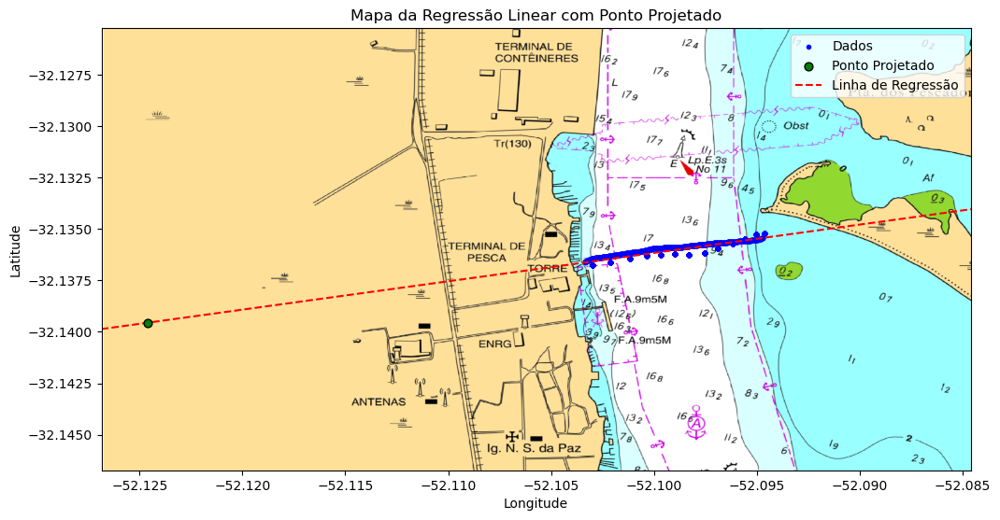

In [155]:
# Definindo o ponto projetado com base nas coordenadas xref e yref da regressão
ponto_projetado = (xref, yref)

# Criar a função polinomial da reta de regressão linear a partir dos coeficientes
reta_regressao = np.poly1d([slope, intercept])

# Gerar uma linha representando a reta de regressão ao longo de uma extensão dos valores de longitude
longs_ext = np.linspace(min(longs) - 0.05, max(longs) + 0.05, 100)  # 100 pontos para uma extensão visual adequada
lats_ext = reta_regressao(longs_ext)
linha_regressao = LineString(list(zip(longs_ext, lats_ext)))

# Criar um GeoDataFrame para armazenar as geometrias dos pontos de dados (latitude e longitude)
geometry = [Point(lon, lat) for lat, lon in zip(lats, longs)]
gdf = gpd.GeoDataFrame(geometry=geometry)

# Criar um GeoDataFrame para o ponto projetado na regressão
gdf_ponto = gpd.GeoDataFrame(geometry=[Point(ponto_projetado)])

# Criar um GeoDataFrame para a linha de regressão gerada
gdf_linha = gpd.GeoDataFrame(geometry=[linha_regressao])

# Abrir o mapa base (basemap) usando rasterio
basemap = rasterio.open(basemap_path)

# Configurar a figura e o eixo para a plotagem
fig, ax = plt.subplots(figsize=(12, 8))

# Mostrar o basemap como fundo do gráfico
show(basemap, ax=ax, cmap='Blues')

# Plotar os dados de ADCP e CTD
gdf.plot(ax=ax, marker='.', color='blue', label='Dados')  # Nuvem de pontos de dados
gdf_ponto.plot(ax=ax, marker='o', color='green', label='Ponto Projetado', zorder=3, markersize=40, edgecolors='black')  # Ponto projetado
gdf_linha.plot(ax=ax, color='red', linestyle='--', label='Linha de Regressão')  # Linha de regressão

# Adicionar título, rótulos de eixos e legenda
plt.title('Mapa da Regressão Linear com Ponto Projetado')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()

# Ajustar os limites do gráfico para proporcionar um leve zoom out
ax.set_xlim(min(longs) - 0.0235, max(longs) + 0.01)
ax.set_ylim(min(lats) - 0.01, max(lats) + 0.01)

# Se necessário, salvar o gráfico como imagem
# plt.savefig("MapaRegressaoLinearADCPeCTD.png")

# Mostrar o gráfico na tela
plt.show()

In [157]:
# Chamar a função para calcular as distâncias relativas
distancia_adcp, distancia_ctd = calcular_distancias_relativas(adcp_coords, ctd_coords, xref, yref, conversao)

In [158]:
# Adicionar a coluna 'distancia' ao dataframe adcp_df
adcp_df['distancia'] = distancia_adcp

In [159]:
# Adicionar a coluna 'distancia' a cada dataframe na lista perfis_descida
for i, df in enumerate(perfis_descida):
    df['distancia'] = distancia_ctd[i]

#### Plotando dados de CTD: MBS x Distância 

In [161]:
# Atualizando a união dos DataFrames da lista em um único DataFrame
df_descida = pd.concat(perfis_descida, ignore_index=True)

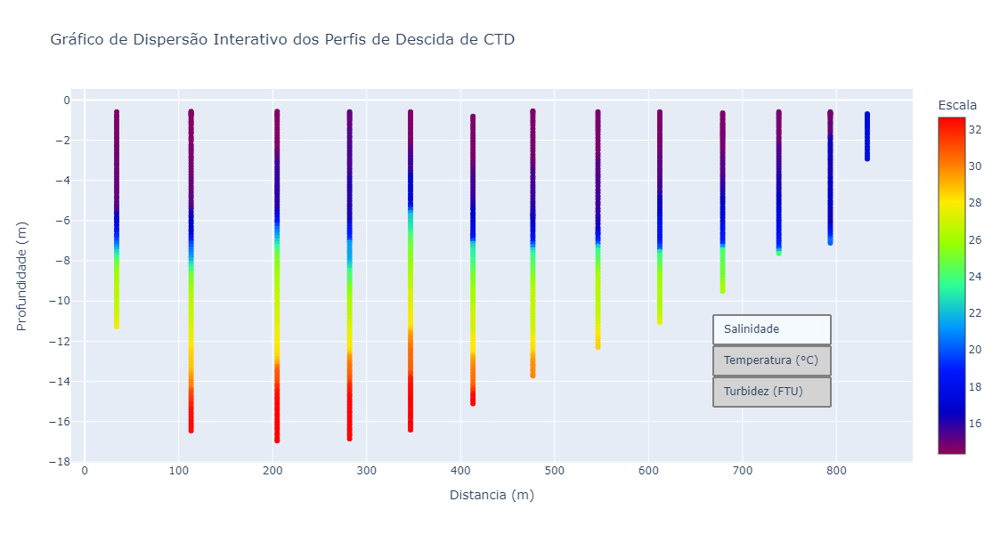

In [165]:
# Dados iniciais
dados_x = df_descida['distancia']
dados_y = df_descida['profundidade']
dados_z = df_descida['salinidade']  # Começa com salinidade como cor padrão

# Criar a figura inicial
fig = go.Figure(data=go.Scatter(x=dados_x, y=dados_y, mode='markers',
                                marker=dict(color=dados_z, colorscale='Rainbow', colorbar=dict(title='Escala')),
                                text=['Salinidade: {:.2f}<br>Temperatura: {:.2f}<br>Turbidez: {:.2f}'.format(s, t, u) 
                                      for s, t, u in zip(df_descida['salinidade'], df_descida['temperatura'], df_descida['turbidez'])]))

# Adicionar título e rótulos dos eixos
fig.update_layout(title='Gráfico de Dispersão Interativo dos Perfis de Descida de CTD',
                  xaxis_title='Distancia (m)',
                  yaxis_title='Profundidade (m)')

# Definir botões para alternar entre as variáveis de cor
buttons = []
for nome, dados_cor in [('Salinidade', df_descida['salinidade']),
                        ('Temperatura (°C)', df_descida['temperatura']),
                        ('Turbidez (FTU)', df_descida['turbidez'])]:
    botao = dict(label=nome,
                  method="update",
                  args=[{"marker.color": [dados_cor]},
                        {"marker.colorbar.title.text": nome}])
    buttons.append(botao)

# Adicionar botões para alternar as variáveis de cor
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="down",
            buttons=buttons,
            x=0.9,
            xanchor='right',
            y=0.4,
            yanchor='top',
            # Destacar o botão selecionado
            showactive=True,
            bgcolor='lightgrey',  # Cor de fundo para o botão selecionado
            bordercolor='grey',   # Cor do contorno do botão selecionado
            borderwidth=2         # Largura do contorno do botão selecionado
        )
    ]
)

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

fig.update_xaxes(showspikes=True, spikecolor="black", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="black", spikethickness=2)

# Etibir o gráfico
fig.show()

### Suavizando os dados de ADCP em função da distância
A taxa amostral dos dados de adcp foi de 2Hz. Ou seja, um ensemble a cada meio segundo. Após a suavização teremos um ensemble a cada 10 segundos (0.1Hz). 

A suavização dos dados de ADCP, através da média por intervalos de distância, reduz a variabilidade aleatória, atenuando outliers e flutuações não sistemáticas. Esse processo destaca as tendências centrais dos dados, facilitando a identificação de padrões hidrodinâmicos e melhorando a precisão em cálculos de transporte. Ao reduzir a variância local, a suavização também aumenta a comparabilidade dos dados entre diferentes seções e períodos.

In [170]:
# Calcular as médias de profundidade para cada intervalo de distância
md_prof_arr = calcular_media_por_distancia(adcp_df.distancia, adcp_df.profundidade, 20)

# Calcular as médias de velocidade u para cada intervalo de distância
md_u_arr = calcular_media_por_distancia(adcp_df.distancia, u_arr, 20)

# Calcular as médias de velocidade v para cada intervalo de distância
md_v_arr = calcular_media_por_distancia(adcp_df.distancia, v_arr, 20)

# Calcular as médias de velocidade v para cada intervalo de distância
md_w_arr = calcular_media_por_distancia(adcp_df.distancia, w_arr, 20)

# Calcular as médias de avgBackScatter para cada intervalo de distância
md_avgB_arr = calcular_media_por_distancia(adcp_df.distancia, avgB_arr, 20)

C:\Users\PedroPacheco\AppData\Local\Temp\ipykernel_11268\2744085713.py:31: RuntimeWarning:

Mean of empty slice



Dimensões das matrizes com os dados suavizados de ADCP

In [172]:
print(f'Shape Distâncias: {md_prof_arr[1].shape}')
print(f'Shape Vel. u: {md_u_arr[0].shape}')
print(f'Shape avgB: {md_avgB_arr[0].shape}')
print(f'Shape Niveis: {unique_niveis.shape}')

Shape Distâncias: (41,)
Shape Vel. u: (50, 41)
Shape avgB: (50, 41)
Shape Niveis: (50,)


#### Visualizando dados de ADCP suavizados

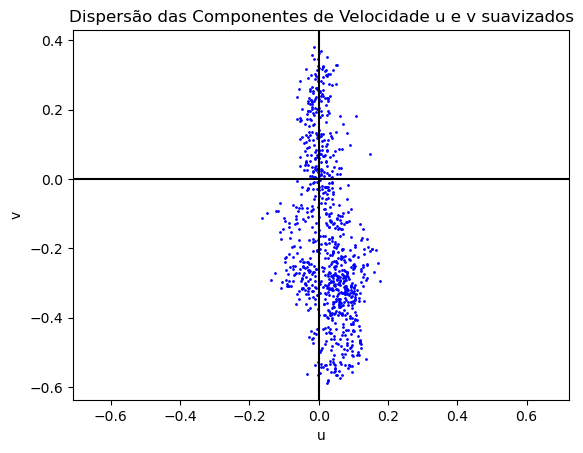

In [174]:
# Avaliando visualmente a necessidade de rotacionar as componentes horizontais da velocidade
plt.plot(md_u_arr[0], md_v_arr[0], 'b.', ms=2)

# Configurando o gráfico
plt.axis('equal')
plt.xlabel('u')
plt.ylabel('v')
plt.axvline(0, color='k')
plt.axhline(0, color='k')

# Adicionando título e legendas
plt.title('Dispersão das Componentes de Velocidade u e v suavizados')

#plt.savefig("AvaliaRotacaoADCP.png")

# Exibindo o gráfico
plt.show()

#### Plotando os dados de ADCP suavizados: MBS x Distância

##### Indicadores de Qualidade dos Dados de ADCP
A componente vertical da velocidade (Vel_w) e a amplitude do sinal (average backscatter, AvgBack) são parâmetros essenciais para avaliar a qualidade dos dados de ADCP. O método de aquisição pressupõe que a velocidade vertical seja próxima de zero, o que é geralmente o caso. Portanto, espera-se que a componente vertical (Vel_w) seja de uma ordem de magnitude menor que as componentes horizontais, que neste caso são a componente longitudinal (Vel_v) e a componente transversal (Vel_u), como demonstrado nos gráficos abaixo. Isso corrobora a qualidade dos dados medidos.

Além disso, a amplitude do sinal (AvgBack) é outro indicador importante de qualidade. Ela deve estar em torno de 3 dB acima do nível de ruído do equipamento, o qual pode variar entre transdutores, mas geralmente fica abaixo de 30 dB em equipamentos em boas condições. Analisando o gráfico correspondente, todas as células apresentam valores superiores a 33 dB, confirmando a integridade e qualidade dos dados obtidos.

In [180]:
# Criar uma grade 2D de coordenadas X e Y usando os valores de distância e níveis
X, Y = np.meshgrid(md_prof_arr[1], unique_niveis)

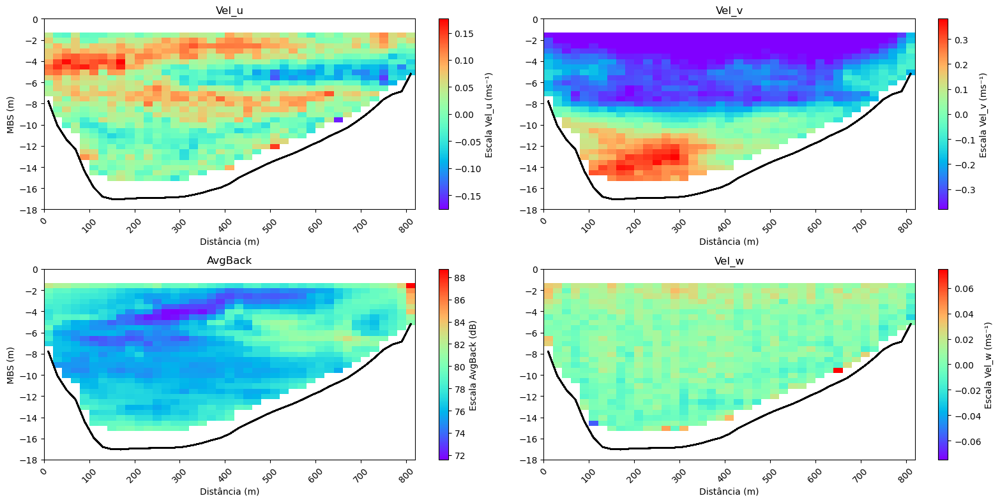

In [181]:
# Cria uma figura com quatro subplots (2x2)
fig, axs = plt.subplots(2, 2, figsize=(16, 8))

# Cria plots de pcolormesh
# Define a normalização de cores para o primeiro subplot
divnorm_u = TwoSlopeNorm(vmin=-1 * np.nanmax(md_u_arr[0]), vcenter=0, vmax=np.nanmax(md_u_arr[0]))
# Plota o primeiro subplot com pcolormesh
p1 = axs[0, 0].pcolormesh(X, -Y, md_u_arr[0], cmap='rainbow', norm=divnorm_u)

# Define a normalização de cores para o segundo subplot
divnorm_v = TwoSlopeNorm(vmin=-1 * np.nanmax(md_v_arr[0]), vcenter=0, vmax=np.nanmax(md_v_arr[0]))
# Plota o segundo subplot com pcolormesh
p2 = axs[0, 1].pcolormesh(X, -Y, md_v_arr[0], cmap='rainbow', norm=divnorm_v)

# Define a normalização de cores para o terceiro subplot
p3 = axs[1, 0].pcolormesh(X, -Y, md_avgB_arr[0], cmap='rainbow')

# Define a normalização de cores para o quarto subplot (Vel_w)
divnorm_w = TwoSlopeNorm(vmin=-1 * np.nanmax(md_w_arr[0]), vcenter=0, vmax=np.nanmax(md_w_arr[0]))
p4 = axs[1, 1].pcolormesh(X, -Y, md_w_arr[0], cmap='rainbow', norm=divnorm_w)

# Define os rótulos e títulos para os subplots
titles = ['Vel_u', 'Vel_v', 'AvgBack', 'Vel_w']
cbar_labels = ['Escala Vel_u (ms\u207B\u00B9)', 'Escala Vel_v (ms\u207B\u00B9)', 'Escala AvgBack (dB)', 'Escala Vel_w (ms\u207B\u00B9)']

# Loop sobre os subplots para adicionar detalhes
for i, ax in enumerate(axs.flat):
    # Plota linhas verticais pretas para indicar a profundidade
    ax.plot(X.T, -md_prof_arr[0], 'k')
    # Define o título do subplot
    ax.set_title(titles[i])
    # Define o rótulo do eixo x
    ax.set_xlabel('Distância (m)')
    # Define o limite do eixo y
    ax.set_ylim(-18, 0)
    # Rotaciona os rótulos do eixo x
    ax.tick_params(axis='x', labelrotation=45)
    # Define o rótulo do eixo y para o primeiro e terceiro subplot
    if i % 2 == 0:
        ax.set_ylabel('MBS (m)')
    # Adiciona a barra de cores ao subplot
    cbar = fig.colorbar([p1, p2, p3, p4][i], ax=ax, orientation='vertical')
    # Define o rótulo da barra de cores
    cbar.set_label(cbar_labels[i])

# Ajusta o layout para evitar sobreposição
plt.tight_layout()

# Salva o gráfico (opcional)
# plt.savefig("PlotADCP_Suavizado_4subplots.png", bbox_inches='tight')

# Exibe o gráfico
plt.show()

### Interpolação e Integração Espacial de Dados ADCP e CTD para Análise Conjunta

#### Interpolação Vertical dos Perfis CTD

In [186]:
# Interpolar todos os perfis CTD
perfis_ctd_interpolados = [interpolar_perfil_sem_extrapolacao(perfil, unique_niveis) for perfil in perfis_descida]

In [187]:
# União dos DataFrames interpolados da lista em um único DataFrame
df_ctd_interp = pd.concat(perfis_ctd_interpolados, ignore_index=True)

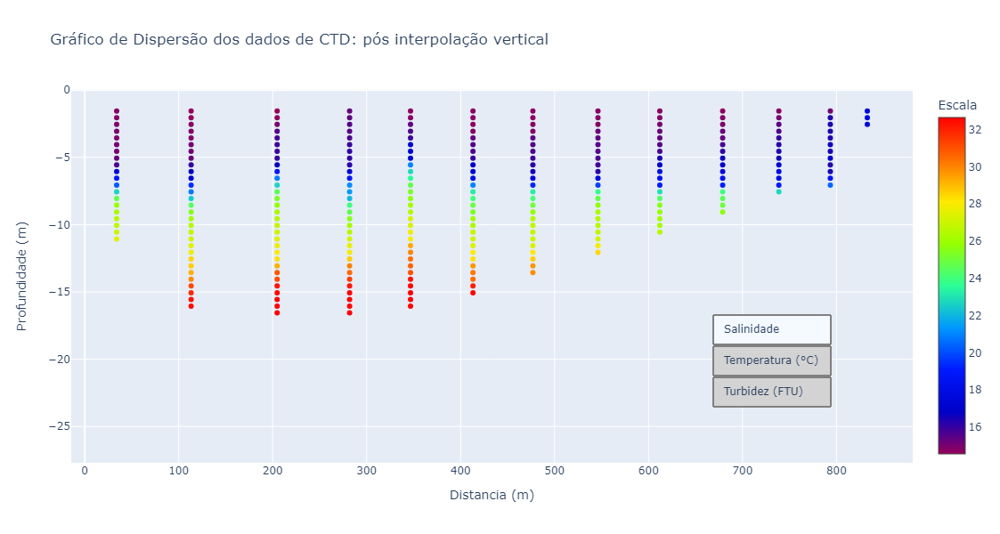

In [190]:
# Dados iniciais
dados_x = df_ctd_interp['distancia']
dados_y = -df_ctd_interp['profundidade']
dados_z = df_ctd_interp['salinidade']  # Começa com salinidade como cor padrão

# Criar a figura inicial
fig = go.Figure(data=go.Scatter(x=dados_x, y=dados_y, mode='markers',
                                marker=dict(color=dados_z, colorscale='Rainbow', colorbar=dict(title='Escala')),
                                text=['Salinidade: {:.2f}<br>Temperatura: {:.2f}<br>Turbidez: {:.2f}'.format(s, t, u) 
                                      for s, t, u in zip(df_ctd_interp['salinidade'], df_ctd_interp['temperatura'], df_ctd_interp['turbidez'])]))

# Adicionar título e rótulos dos eixos
fig.update_layout(title='Gráfico de Dispersão dos dados de CTD: pós interpolação vertical',
                  xaxis_title='Distancia (m)',
                  yaxis_title='Profundidade (m)')

# Definir botões para alternar entre as variáveis de cor
buttons = []
for nome, dados_cor in [('Salinidade', df_ctd_interp['salinidade']),
                        ('Temperatura (°C)', df_ctd_interp['temperatura']),
                        ('Turbidez (FTU)', df_ctd_interp['turbidez'])]:
    botao = dict(label=nome,
                  method="update",
                  args=[{"marker.color": [dados_cor]},
                        {"marker.colorbar.title.text": nome}])
    buttons.append(botao)

# Adicionar botões para alternar as variáveis de cor
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="down",
            buttons=buttons,
            x=0.9,
            xanchor='right',
            y=0.4,
            yanchor='top',
            # Destacar o botão selecionado
            showactive=True,
            bgcolor='lightgrey',  # Cor de fundo para o botão selecionado
            bordercolor='grey',   # Cor do contorno do botão selecionado
            borderwidth=2         # Largura do contorno do botão selecionado
        )
    ]
)

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

fig.update_xaxes(showspikes=True, spikecolor="black", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="black", spikethickness=2)

# Etibir o gráfico
fig.show()

#### Interpolação Horizontal dos Perfis CTD

In [193]:
dados_ctd_combinados =  processar_e_extrapolar_dados_ctd(df_ctd_interp, md_prof_arr)

In [194]:
# Interpolar os dados de CTD para corresponder às distâncias do ADCP
dados_interpolados = {}

# Lista de variáveis para interpolação
variaveis = ['temperatura', 'salinidade', 'turbidez', 'pressao']

for variavel in variaveis:
    pontos = dados_ctd_combinados[['distancia', 'profundidade']].values
    valores = dados_ctd_combinados[variavel].values
    grid_x, grid_y = np.meshgrid(md_prof_arr[1], dados_ctd_combinados['profundidade'].unique())
    grid_z = griddata(pontos, valores, (grid_x, grid_y), method='linear')
    dados_interpolados[variavel] = grid_z

# Criar DataFrames interpolados para cada perfil ADCP
perfis_interpolados = []

for i in range(grid_x.shape[1]):
    df_perfil = pd.DataFrame({
        'profundidade': dados_ctd_combinados['profundidade'].unique(),
        'distancia': grid_x[:, i],
        'temperatura': dados_interpolados['temperatura'][:, i],
        'salinidade': dados_interpolados['salinidade'][:, i],
        'turbidez': dados_interpolados['turbidez'][:, i],
        'pressao': dados_interpolados['pressao'][:, i]
    })
    perfis_interpolados.append(df_perfil)

In [195]:
# Aplicando a função ajustada
perfis_ajustados = ajustar_perfis(perfis_interpolados, unique_niveis)

In [198]:
# União dos DataFrames interpolados da lista em um único DataFrame
ctd_interpolados_horizontal = pd.concat(perfis_ajustados, ignore_index=True)

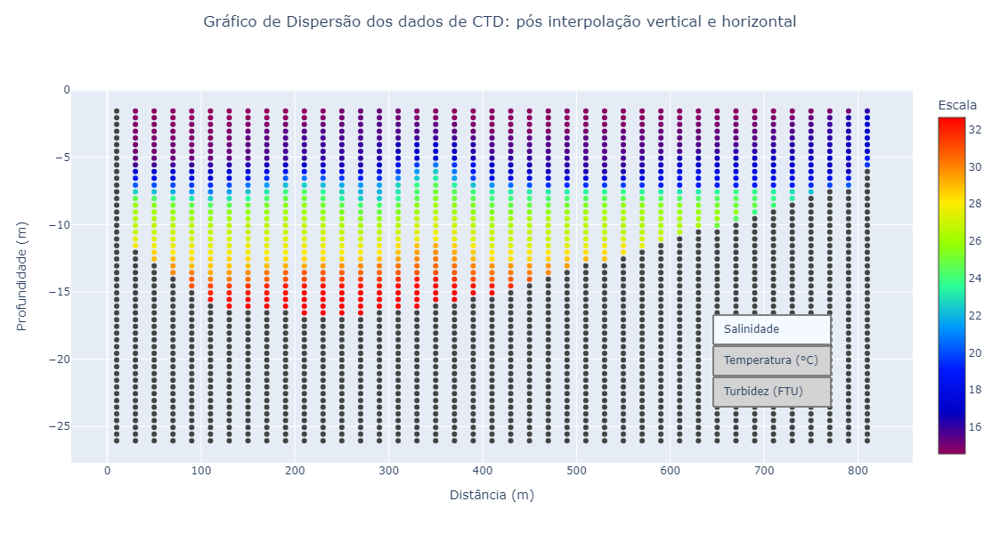

In [199]:
# Dados iniciais
dados_x = ctd_interpolados_horizontal['distancia']
dados_y = -ctd_interpolados_horizontal['profundidade']
dados_z = ctd_interpolados_horizontal['salinidade']  # Começa com salinidade como cor padrão

# Criar a figura inicial
fig = go.Figure(data=go.Scatter(x=dados_x, y=dados_y, mode='markers',
                                marker=dict(color=dados_z, colorscale='Rainbow', colorbar=dict(title='Escala')),
                                text=['Salinidade: {:.2f}<br>Temperatura: {:.2f}<br>Turbidez: {:.2f}'.format(s, t, u) 
                                      for s, t, u in zip(ctd_interpolados_horizontal['salinidade'], ctd_interpolados_horizontal['temperatura'], ctd_interpolados_horizontal['turbidez'])]))

# Adicionar título, subtítulo com informações da matriz e rótulos dos eixos
fig.update_layout(
    title={
        'text': f"Gráfico de Dispersão dos dados de CTD: pós interpolação vertical e horizontal<br>",
        'y': 0.95,  # Posição vertical do título
        'x': 0.5,   # Posição horizontal do título (centralizado)
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir botões para alternar entre as variáveis de cor
buttons = []
for nome, dados_cor in [('Salinidade', ctd_interpolados_horizontal['salinidade']),
                        ('Temperatura (°C)', ctd_interpolados_horizontal['temperatura']),
                        ('Turbidez (FTU)', ctd_interpolados_horizontal['turbidez'])]:
    botao = dict(label=nome,
                  method="update",
                  args=[{"marker.color": [dados_cor]},
                        {"marker.colorbar.title.text": nome}])
    buttons.append(botao)

# Adicionar botões para alternar as variáveis de cor
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="down",
            buttons=buttons,
            x=0.9,
            xanchor='right',
            y=0.4,
            yanchor='top',
            # Destacar o botão selecionado
            showactive=True,
            bgcolor='lightgrey',  # Cor de fundo para o botão selecionado
            bordercolor='grey',   # Cor do contorno do botão selecionado
            borderwidth=2         # Largura do contorno do botão selecionado
        )
    ]
)

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

fig.update_xaxes(showspikes=True, spikecolor="black", spikethickness=2)
fig.update_yaxes(showspikes=True, spikecolor="black", spikethickness=2)

# Etibir o gráfico
fig.show()

Organização dos parâmetros de CTD em arrays bidimensionais

In [201]:
# Extrair profundidade e distancia como arrays
profundidade = ctd_interpolados_horizontal['profundidade'].unique()
distancia = ctd_interpolados_horizontal['distancia'].unique()

# Verificar as dimensões esperadas
print(f"Dimensão de profundidade: {profundidade.shape}")
print(f"Dimensão de distancia: {distancia.shape}")

# Inicializar arrays para temperatura, salinidade e turbidez
temperatura = np.full((len(profundidade), len(distancia)), np.nan)
salinidade = np.full((len(profundidade), len(distancia)), np.nan)
turbidez = np.full((len(profundidade), len(distancia)), np.nan)
pressao = np.full((len(profundidade), len(distancia)), np.nan)

# Preencher os arrays com os dados do DataFrame
for d in distancia:
    subset = ctd_interpolados_horizontal[ctd_interpolados_horizontal['distancia'] == d]
    for i, p in enumerate(profundidade):
        row = subset[subset['profundidade'] == p]
        if not row.empty:
            temperatura[i, list(distancia).index(d)] = row['temperatura'].values[0]
            salinidade[i, list(distancia).index(d)] = row['salinidade'].values[0]
            turbidez[i, list(distancia).index(d)] = row['turbidez'].values[0]
            pressao[i, list(distancia).index(d)] = row['pressao'].values[0]

# Verificar as dimensões dos arrays resultantes
print(f"Dimensão de temperatura: {temperatura.shape}")
print(f"Dimensão de salinidade: {salinidade.shape}")
print(f"Dimensão de turbidez: {turbidez.shape}")
print(f"Dimensão de pressão: {pressao.shape}")

Dimensão de profundidade: (50,)
Dimensão de distancia: (41,)
Dimensão de temperatura: (50, 41)
Dimensão de salinidade: (50, 41)
Dimensão de turbidez: (50, 41)
Dimensão de pressão: (50, 41)


#### Gráfico de contorno: CTD

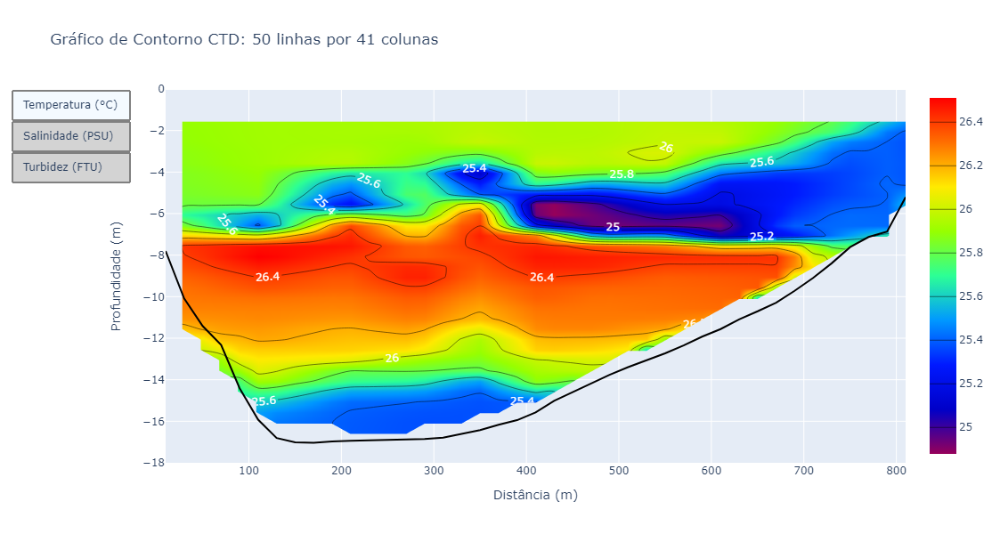

In [203]:
# Dados para o gráfico
dados_x = distancia
dados_y = -profundidade
dados_z = temperatura  # Primeiro subplot

# Criar a figura inicial
fig = go.Figure(data=go.Contour(z=dados_z, x=dados_x, y=dados_y,
        line_smoothing=0.85,
        colorscale='Rainbow',
        colorbar=dict(
            titleside='right',
            titlefont=dict(size=14, family='Arial, sans-serif')),
        contours=dict(
            coloring='heatmap',
            showlabels=True,
            labelfont=dict(size=12, color='white')
        )
))

# Adicionar o fundo
fig.add_trace(go.Scatter(x=md_prof_arr[1], y=-md_prof_arr[0], mode='lines', name='Fundo', line=dict(color='black')))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title=f'Gráfico de Contorno CTD: {len(dados_y)} linhas por {len(dados_x)} colunas',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância para as variáveis
buttons = []
for nome, dados_z in [('Temperatura (°C)', temperatura), 
                      ('Salinidade (PSU)', salinidade),
                      ('Turbidez (FTU)', turbidez)]:
    botao = dict(label=nome, method="update", args=[{"z": [dados_z]}, {"coloraxis.colorbar.title": nome}])
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons", 
                                    buttons=buttons,
                                    bgcolor='lightgrey',
                                    bordercolor='grey',
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-18, 0]))  # Define os limites

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()


#### Gráfico de contorno: ADCP

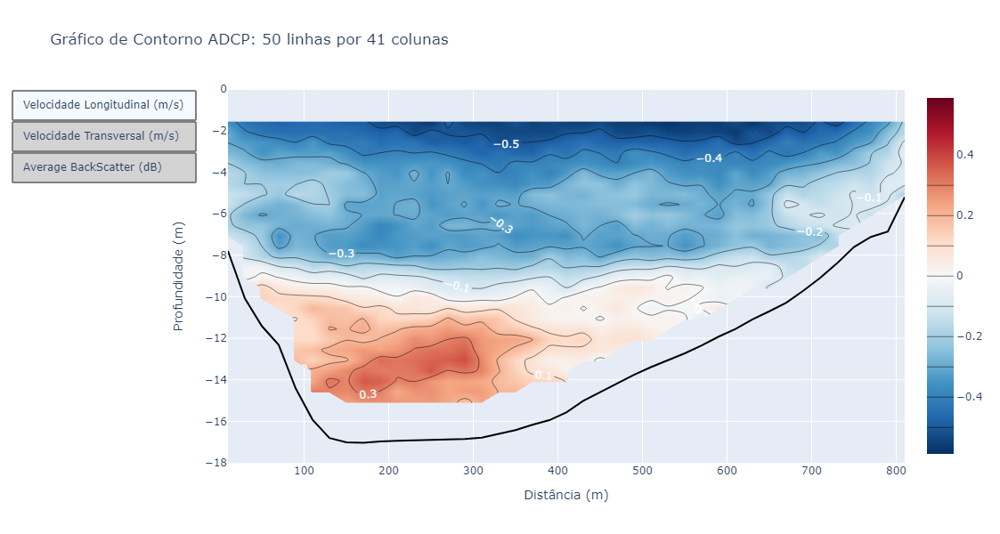

In [205]:
# Dados iniciais
dados_x = md_v_arr[1]
dados_y = -unique_niveis

# Criar a figura inicial
fig = go.Figure(data=go.Contour(z=md_v_arr[0], x=dados_x, y=dados_y,
        line_smoothing=0.85,
        colorscale='rdbu_r',  # Escala de cores para o primeiro gráfico
        zmid=0,  # Centralizar o zero na cor branca
        colorbar=dict(
            titleside='right',
            titlefont=dict(
                size=14,
                family='Arial, sans-serif')),
        contours=dict(
            coloring='heatmap',
            showlabels=True,  # Mostrar rótulos nos contornos
            labelfont=dict(  # Propriedades da fonte do rótulo
                size=12,
                color='white',
            ))
))

# Adicionar o fundo
fig.add_trace(go.Scatter(x=md_prof_arr[1], y=-md_prof_arr[0], mode='lines', name='Fundo', line=dict(color='black')))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title=f'Gráfico de Contorno ADCP: {len(dados_y)} linhas por {len(dados_x)} colunas',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância
buttons = []
for i, (nome, dados_z) in enumerate([('Velocidade Longitudinal (m/s)', md_v_arr[0]), 
                                     ('Velocidade Transversal (m/s)', md_u_arr[0]),
                                     ('Average BackScatter (dB)', md_avgB_arr[0])]):
    if i < 2:  # Para os dois primeiros gráficos
        escala = 'rdbu_r'
        zmid = 0  # Centralizar o zero no branco
    else:  # Para o terceiro gráfico
        escala = 'Rainbow'
        zmid = None  # Sem centralização

    botao = dict(
        label=nome, 
        method="update", 
        args=[
            {"z": [dados_z], "colorscale": escala, "zmid": zmid}  # Atualiza z, escala de cores e zmid
        ]
    )
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons", 
                                    buttons=buttons,
                                    bgcolor='lightgrey',  # Cor de fundo para o botão selecionado
                                    bordercolor='grey',   # Cor do contorno do botão selecionado
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-18, 0]))  # Defina os limites

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()


#### Gráfico unificado: ADCP + CTD

No gráfico abaixo, as matrizes de ambos os conjuntos de dados (CTD e ADCP), agora com as mesmas dimensões, foram sobrepostas ponto a ponto. No entanto, ainda há discrepâncias, com valores presentes em uma matriz enquanto correspondem a valores ausentes (NaN) na outra, e vice-versa.

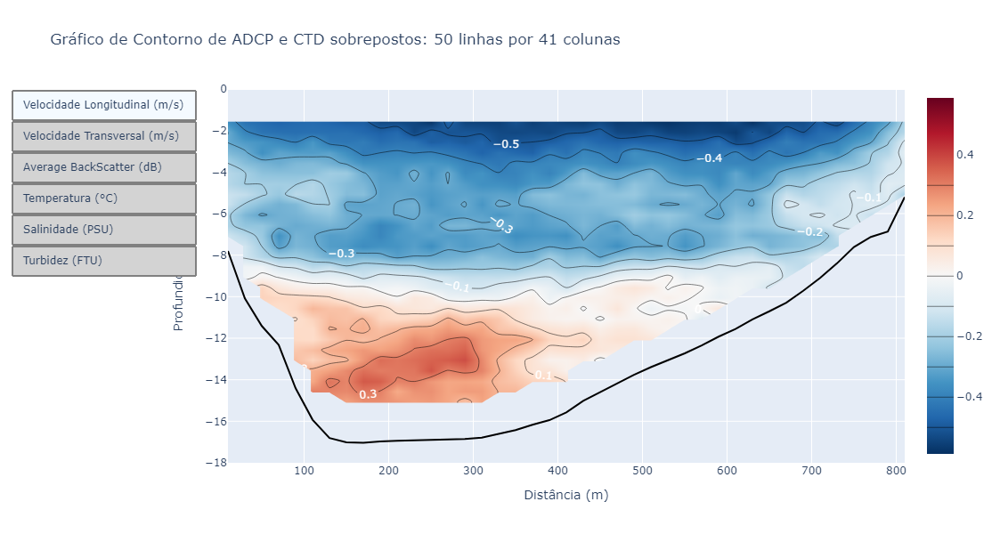

In [208]:
# Dados unificados
dados_x = md_v_arr[1]
dados_y = -unique_niveis  # Equivalente a -profundidade

# Definir as escalas de cores
colorscale_adcp = 'rdbu_r'
colorscale_ctd = 'Rainbow'

# Criar a figura inicial com os primeiros dados
fig = go.Figure(data=go.Contour(z=md_v_arr[0], x=dados_x, y=dados_y,
        line_smoothing=0.85,
        colorscale=colorscale_adcp,  # Usar a escala de cores do ADCP inicialmente
        zmid=0,  # Centralizar o zero na cor branca para o primeiro gráfico
        colorbar=dict(
            titleside='right',
            titlefont=dict(size=14, family='Arial, sans-serif')),
        contours=dict(
            coloring='heatmap',
            showlabels=True,
            labelfont=dict(size=12, color='white')
        )
))

# Adicionar o fundo
fig.add_trace(go.Scatter(x=md_prof_arr[1], y=-md_prof_arr[0], mode='lines', name='Fundo', line=dict(color='black')))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title=f'Gráfico de Contorno de ADCP e CTD sobrepostos: {len(dados_y)} linhas por {len(dados_x)} colunas',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância para as variáveis ADCP e CTD
buttons = []
for i, (nome, dados_z) in enumerate([('Velocidade Longitudinal (m/s)', md_v_arr[0]), 
                                     ('Velocidade Transversal (m/s)', md_u_arr[0]),
                                     ('Average BackScatter (dB)', md_avgB_arr[0]),
                                     ('Temperatura (°C)', temperatura), 
                                     ('Salinidade (PSU)', salinidade),
                                     ('Turbidez (FTU)', turbidez)]):
    # Escolher a escala de cores com base no índice
    if i < 2:  # Para os dois primeiros gráficos (Velocidade Longitudinal e Transversal)
        escala = colorscale_adcp
        zmid = 0  # Centralizar o zero no branco
    else:  # Para os gráficos subsequentes
        escala = colorscale_ctd
        zmid = None  # Sem centralização

    botao = dict(
        label=nome, 
        method="update", 
        args=[
            {"z": [dados_z], "colorscale": escala, "zmid": zmid},  # Atualiza z, escala de cores e zmid
            {"coloraxis.colorbar.title": nome}
        ]
    )
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons", 
                                    buttons=buttons,
                                    bgcolor='lightgrey',
                                    bordercolor='grey',
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-18, 0]))  # Defina os limites

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()


# Calculando o transporte advectivo das grandezas escalares

### Adequação de NaN em ambos conjuntos de dados
Para realizar os cálculos de transporte de forma precisa, é essencial que os dados sejam completamente sincronizados no espaço, de modo que os arrays tenham as mesmas dimensões. Além disso, é crucial garantir que, nos pontos (nNível x nPerfil) onde um array apresenta valores ausentes (NaN), os outros também tenham NaN, e, de forma semelhante, que os dados válidos estejam presentes em todos os arrays nas mesmas posições. Esse alinhamento adequado foi alcançado e é mostrado na figura a seguir.

In [218]:
# Unir os dados de CTD e ADCP para facilitar a manipulação
ctd_data = [temperatura, salinidade, turbidez, pressao]
adcp_data = [md_v_arr[0], md_u_arr[0], md_avgB_arr[0]]

# Criar uma máscara de NaN a partir dos dados de CTD
nan_mask_ctd = np.isnan(temperatura) | np.isnan(salinidade) | np.isnan(turbidez) | np.isnan(pressao)

# Criar uma máscara de NaN a partir dos dados de ADCP
nan_mask_adcp = np.isnan(md_v_arr[0]) | np.isnan(md_u_arr[0]) | np.isnan(md_avgB_arr[0])

# Combinar as máscaras para ter NaN em ambas as fontes de dados
combined_nan_mask = nan_mask_ctd | nan_mask_adcp

# Aplicar a máscara combinada aos dados de CTD
for i in range(len(ctd_data)):
    ctd_data[i][combined_nan_mask] = np.nan

# Aplicar a máscara combinada aos dados de ADCP
for i in range(len(adcp_data)):
    adcp_data[i][combined_nan_mask] = np.nan

# Atualizar os arrays originais com os novos valores
temp, sal, turb, pressao = ctd_data
comp_longitudinal, comp_transversal, avgB = adcp_data

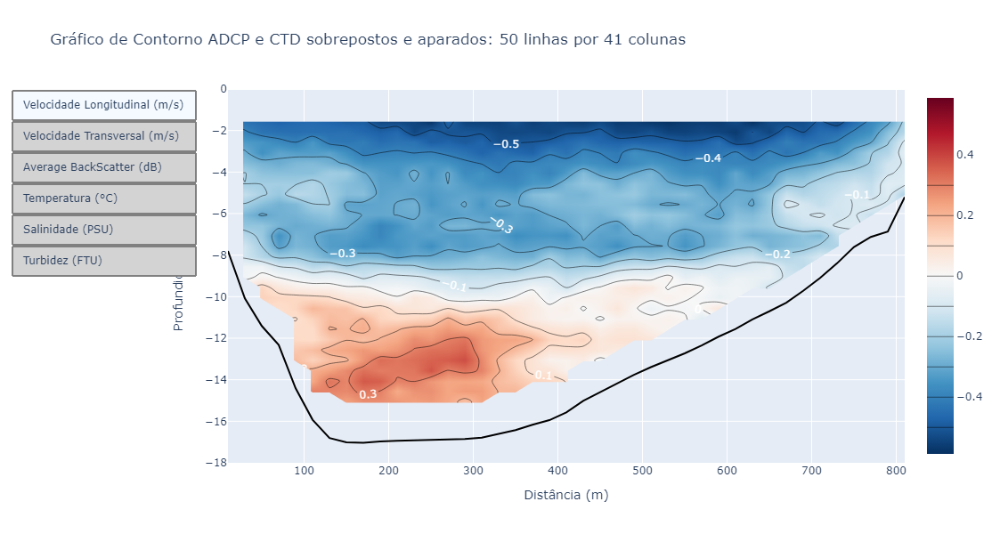

In [220]:
# Criar a figura inicial com os primeiros dados
fig = go.Figure(data=go.Contour(z=comp_longitudinal, x=dados_x, y=dados_y,
        line_smoothing=0.85,
        colorscale=colorscale_adcp,  # Usar a escala de cores do ADCP inicialmente
        zmid=0,  # Centralizar o zero na cor branca para o primeiro gráfico
        colorbar=dict(
            titleside='right',
            titlefont=dict(size=14, family='Arial, sans-serif')),
        contours=dict(
            coloring='heatmap',
            showlabels=True,
            labelfont=dict(size=12, color='white')
        )
))

# Adicionar o fundo
fig.add_trace(go.Scatter(x=dados_x, y=-md_prof_arr[0], mode='lines', name='Fundo', line=dict(color='black')))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title=f'Gráfico de Contorno ADCP e CTD sobrepostos e aparados: {len(dados_y)} linhas por {len(dados_x)} colunas',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância para as variáveis ADCP e CTD
buttons = []
for i, (nome, dados_z) in enumerate([('Velocidade Longitudinal (m/s)', comp_longitudinal), 
                                     ('Velocidade Transversal (m/s)', comp_transversal),
                                     ('Average BackScatter (dB)', avgB),
                                     ('Temperatura (°C)', temp), 
                                     ('Salinidade (PSU)', sal),
                                     ('Turbidez (FTU)', turb)]):
    # Escolher a escala de cores com base no índice
    if i < 2:  # Para os dois primeiros gráficos (Velocidade Longitudinal e Transversal)
        escala = colorscale_adcp
        zmid = 0  # Centralizar o zero no branco
    else:  # Para os gráficos subsequentes
        escala = colorscale_ctd
        zmid = None  # Sem centralização

    botao = dict(
        label=nome, 
        method="update", 
        args=[
            {"z": [dados_z], "colorscale": escala, "zmid": zmid},  # Atualiza z, escala de cores e zmid
            {"coloraxis.colorbar.title": nome}
        ]
    )
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons", 
                                    buttons=buttons,
                                    bgcolor='lightgrey',
                                    bordercolor='grey',
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-18, 0]))  # Defina os limites

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()

#### Criando xarray unificado

Após a sincronização espacial dos dados é vantajoso organizá-los em um dataset do xarray. O xarray facilita a manipulação e análise de dados multidimensionais, permitindo operações eficientes em arrays rotulados, como o cálculo de médias, interpolação e visualização. 

Além disso, o xarray oferece suporte nativo para metadados e coordenadas, sendo ideal para dados ambientais e oceanográficos. 

Outra vantagem importante é a possibilidade de exportar os dados diretamente no formato NetCDF, amplamente utilizado para armazenamento e intercâmbio de dados científicos, especialmente em estudos climáticos e oceânicos.

In [223]:
import xarray as xr # Biblioteca para manipulação de dados multidimensionais (Datasets e DataArrays)

# Definir as coordenadas
distancias = dados_x  # (41,) - distâncias horizontais
profundidades = md_prof_arr[0]  # (41,) - profundidades associadas às medições
niveis = dados_y  # (50,) - distâncias das niveis de medição em relação ao ADCP

# Criar um xarray Dataset para unificar todos os dados
dataset = xr.Dataset(
    {
        "temperatura": (["nivel", "distancia"], temperatura),
        "salinidade": (["nivel", "distancia"], salinidade),
        "turbidez": (["nivel", "distancia"], turbidez),
        "velocidade_longitudinal": (["nivel", "distancia"], md_v_arr[0]),
        "velocidade_transversal": (["nivel", "distancia"], md_u_arr[0]),
        "average_backscatter": (["nivel", "distancia"], md_avgB_arr[0]),
        "pressao": (["nivel", "distancia"], pressao),
    },
    coords={
        "distancia": distancias,  # Dimensão de (41,)
        "nivel": niveis,        # Dimensão de (50,)
        "profundidade": ("distancia", profundidades)  # Adiciona a profundidade como uma coordenada unidimensional
    }
)

### Conversão de Turbidez em SSC

A conversão de turbidez em concentração de sedimentos em suspensão (SSC) é baseada em uma equação calibrada empiricamente pelo Dr. Carlos Augusto França Schettini. Essa calibração foi desenvolvida a partir de dados coletados no estuário da Lagoa dos Patos, permitindo uma correlação precisa entre as medições de turbidez e a concentração de sedimentos em suspensão na região.


A equação que relaciona turbidez à concentração de sedimentos em suspensão (SSC) é dada por:

$$
\text{SSC} = 8.215 + 0.455 \cdot \text{turbidez}
$$

A equação apresenta um coeficiente de determinação \( r^2 = 0.79 \), indicando uma boa correlação entre turbidez e SSC no estuário da Lagoa do Patos.


In [227]:
# Calcular SSC usando a equação empírica
ssc = 8.215 + 0.455 * turbidez

# Criar o DataArray de SSC com a unidade (mg/l)
ssc = xr.DataArray(ssc, dims=["nivel", "distancia"])

# Adicionar o SSC ao Dataset como uma nova variável
dataset["ssc"] = ssc

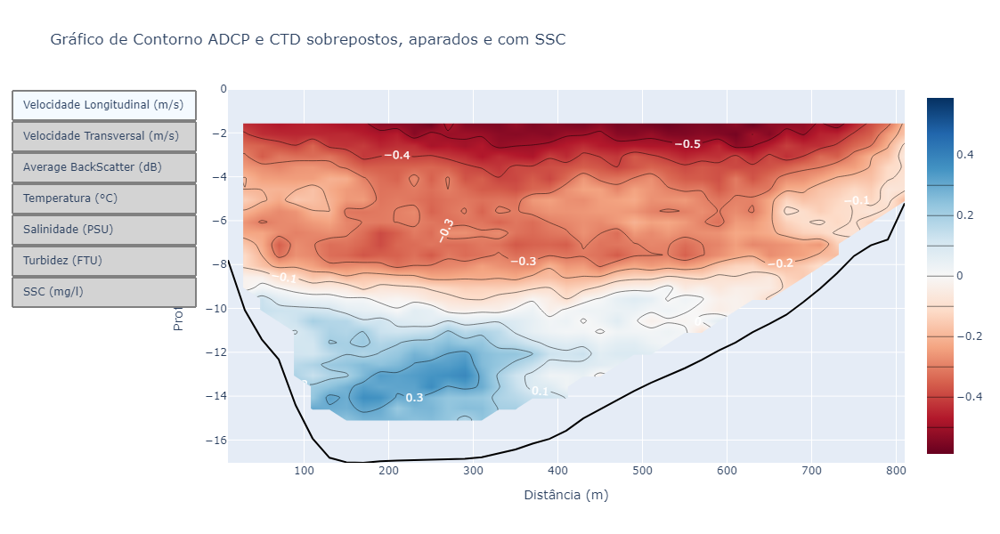

In [228]:
# Definir as cores para ADCP e CTD
colorscale_adcp = 'RdBu'  # Escala de cores para as variáveis ADCP
colorscale_ctd = 'Viridis'  # Escala de cores para as variáveis CTD

# Converter os dados para NumPy arrays para evitar problemas de serialização
velocidade_longitudinal = dataset['velocidade_longitudinal'].values
velocidade_transversal = dataset['velocidade_transversal'].values
average_backscatter = dataset['average_backscatter'].values
temperatura = dataset['temperatura'].values
salinidade = dataset['salinidade'].values
turbidez = dataset['turbidez'].values
ssc = dataset['ssc'].values

# Criar a figura inicial com os primeiros dados (por exemplo, velocidade longitudinal)
fig = go.Figure(data=go.Contour(
    z=velocidade_longitudinal,  # Dados de velocidade longitudinal
    x=dataset['distancia'].values,  # Coordenada de distância
    y=dataset['nivel'].values,  # Coordenada de níveis
    line_smoothing=0.85,
    colorscale=colorscale_adcp,  # Escala de cores para o ADCP inicialmente
    zmid=0,  # Centralizar o zero na cor branca para o primeiro gráfico
    colorbar=dict(
        titleside='right',
        titlefont=dict(size=14, family='Arial, sans-serif')),
    contours=dict(
        coloring='heatmap',
        showlabels=True,
        labelfont=dict(size=12, color='white')
    )
))

# Adicionar o fundo (profundidade)
fig.add_trace(go.Scatter(
    x=dataset['distancia'].values, 
    y=-dataset['profundidade'].values, 
    mode='lines', 
    name='Fundo', 
    line=dict(color='black')
))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title=f'Gráfico de Contorno ADCP e CTD sobrepostos, aparados e com SSC',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância para as variáveis ADCP e CTD
buttons = []
for i, (nome, dados_z) in enumerate([
    ('Velocidade Longitudinal (m/s)', velocidade_longitudinal),
    ('Velocidade Transversal (m/s)', velocidade_transversal),
    ('Average BackScatter (dB)', average_backscatter),
    ('Temperatura (°C)', temperatura),
    ('Salinidade (PSU)', salinidade),
    ('Turbidez (FTU)', turbidez),
    ('SSC (mg/l)', ssc)
]):
    # Escolher a escala de cores com base no índice
    if i < 2:  # Para as variáveis do ADCP
        escala = colorscale_adcp
        zmid = 0  # Centralizar o zero no branco
    else:  # Para as variáveis do CTD
        escala = colorscale_ctd
        zmid = None  # Sem centralização

    botao = dict(
        label=nome,
        method="update",
        args=[
            {"z": [dados_z], "colorscale": escala, "zmid": zmid},  # Atualiza z, escala de cores e zmid
            {"coloraxis.colorbar.title": nome}
        ]
    )
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons",
                                    buttons=buttons,
                                    bgcolor='lightgrey',
                                    bordercolor='grey',
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-np.max(dataset['profundidade'].values), 0]))  # Defina os limites de profundidade

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()

### Calculando o Transporte Advectivo das Grandezas Escalares - Fluxo de Massa

**Transporte Longitudinal**: Valores positivos indicam fluxo no sentido do estuário (entrada), enquanto valores negativos indicam fluxo no sentido do Oceano Atlântico (saída).

**Transporte Transversal**: Valores positivos indicam fluxo no sentido Leste, enquanto valores negativos indicam fluxo no sentido Oeste.

A equação utilizada como base para os cálculos de transporte foi a equação do transporte por advecção, conforme descrita por **Chapra (1997)**. Essa equação descreve o fluxo de uma substância ao longo de um volume de controle, considerando a velocidade do fluido e a concentração da substância transportada. De forma geral, o transporte advectivo pode ser expresso como:

$$
F_a(x,t) = V(x,t) \cdot C(x,t)
$$

onde:

- \(F_a(x,t)\) é o fluxo advectivo,
- \(V(x,t)\) é a velocidade do fluido no ponto \(x\) e no tempo \(t\),
- \(C(x,t)\) é a concentração da substância (como sal, calor ou sedimentos) no ponto \(x\) e no tempo \(t\).


Fonte: **Chapra, S. C. (1997), Surface Water-Quality Modeling, McGraw-Hill**.

#### Adicionando unidades

In [234]:
# Adicionando unidades aos atributos do dataset
dataset['distancia'].attrs['units'] = 'm'
dataset['nivel'].attrs['units'] = 'm'
dataset['profundidade'].attrs['units'] = 'm'

dataset['temperatura'].attrs['units'] = '°C'
dataset['salinidade'].attrs['units'] = 'PSU'
dataset['turbidez'].attrs['units'] = 'FTU'

dataset['average_backscatter'].attrs['units'] = 'dB'
dataset['pressao'].attrs['units'] = 'dbar'

dataset['velocidade_longitudinal'].attrs['units'] = 'm/s'
dataset['velocidade_transversal'].attrs['units'] = 'm/s'

In [236]:
# Constantes e dados
distancia = dataset['distancia']  # extrair coordenada de distância
nivel = dataset['nivel'] * -1  # níveis de medição ao longo do transecto

# Calcular as áreas das niveis (diferença entre distâncias e profundidades para obter "largura" e "altura" da nivel)
largura_celula = distancia.diff('distancia')  # diferenças entre as distâncias
altura_celula = nivel.diff('nivel')  # diferenças nas profundidades entre pontos

# Criar uma nova variável de área da célula (altura * largura), em metros quadrados
cell_area = altura_celula * largura_celula

#### Calcular o Transporte Advectivo de SSC

In [239]:
dataset['ssc'] = (dataset['ssc'] / 1000) # convertendo para kg/m³

In [240]:
dataset['ssc'].attrs['units'] = 'kg/m³' # Adicionando unidade

# Calcular o transporte de SSC - longitudinal 
transporte_ssc_long = dataset['ssc'] * dataset['velocidade_longitudinal']

dataset['transporte_ssc_long'] = transporte_ssc_long
# Quilogramas de sedimentos transportados por metro quadrado por segundo (massa transportada pelo fluxo de água)
dataset['transporte_ssc_long'].attrs['units'] = 'kg/m²/s'

# Calcular o transporte de SSC - transversal
transporte_ssc_transv = dataset['ssc'] * dataset['velocidade_transversal']

dataset['transporte_ssc_transv'] = transporte_ssc_transv
# Quilogramas de sedimentos transportados por metro quadrado por segundo (massa transportada pelo fluxo de água)
dataset['transporte_ssc_transv'].attrs['units'] = 'kg/m²/s' 

# Somar ao longo do transecto para obter o transporte total longitudinal de SSC
transporte_total_ssc_long = dataset['transporte_ssc_long'].sum(dim=['distancia', 'nivel'], skipna=True)

# Somar ao lkg/m²/sngo do transecto para obter o transporte total transversal de SSC
transporte_total_ssc_transv = dataset['transporte_ssc_transv'].sum(dim=['distancia', 'nivel'], skipna=True)

# Exibir os resultados com as unidades do pint-xarray preservadas
print(f"Transporte Total SSC Longitudinal: {transporte_total_ssc_long}")
print(f"Transporte Total SSC Transversal: {transporte_total_ssc_transv}")

Transporte Total SSC Longitudinal: <xarray.DataArray 'transporte_ssc_long' ()>
array(-1.37824912)
Transporte Total SSC Transversal: <xarray.DataArray 'transporte_ssc_transv' ()>
array(0.20146298)


#### Calcular o Transporte Advectivo de Calor

In [244]:
# Calculando a capacidade térmica da água (J/kg°C)
cp = gsw.cp_t_exact(dataset['salinidade'], dataset['temperatura'], dataset['pressao'])

# Calculando a densidade da água em cada célula (kg/m³)
densidade = gsw.density.rho(dataset['salinidade'], dataset['temperatura'], dataset['pressao'])

# Calcular o transporte longitudinal de calor para cada célula usando a densidade da água
transporte_calor_long = densidade * cp * dataset['velocidade_longitudinal'] * dataset['temperatura']
# Multiply by temperature to convert to W/m²


dataset['transporte_calor_long'] = transporte_calor_long
dataset['transporte_calor_long'].attrs['units'] = 'W/m²'

# Calcular o transporte transversal de calor para cada célula usando a densidade da água
transporte_calor_transv = densidade * cp *  dataset['velocidade_transversal']  * dataset['temperatura']


dataset['transporte_calor_transv'] = transporte_calor_transv
dataset['transporte_calor_transv'].attrs['units'] = 'W/m²'

# Somar o transporte de calor ao longo do transecto para obter o total longitudinal
transporte_total_long_calor = dataset['transporte_calor_long'].sum(dim=['nivel', 'distancia'], skipna=True)

# Somar o transporte de calor ao longo do transecto para obter o total transversal
transporte_total_transv_calor = dataset['transporte_calor_transv'].sum(dim=['nivel', 'distancia'], skipna=True)

# Converter de W para GW e arredondar para duas casas decimais
transporte_total_long_calor_gw = np.round(transporte_total_long_calor.values / 10**9, 2)
transporte_total_transv_calor_gw = np.round(transporte_total_transv_calor.values / 10**9, 2)

# Imprimir os resultados em GW
print(f"Transporte Total de Calor - Longitudinal: {transporte_total_long_calor_gw} GW")
print(f"Transporte Total de Calor - Transversal: {transporte_total_transv_calor_gw} GW")

Transporte Total de Calor - Longitudinal: -15.94 GW
Transporte Total de Calor - Transversal: 2.29 GW


#### Calcular Transporte Advectivo de Sal

In [247]:
# A constante 0.0008 é uma aproximação que relaciona a salinidade em PSU à concentração de sal em kg/m³
constante_psu_para_kg_m3 = 0.0008
# Converte salinidade de PSU para kg/m³.
salinidade_kg_m3 = constante_psu_para_kg_m3 * dataset['salinidade'] * densidade

# Multiplicando pela velocidade longitudinal e pela área da célula
transporte_sal_long = salinidade_kg_m3 * dataset['velocidade_longitudinal']

dataset['transporte_sal_long'] = transporte_sal_long
dataset['transporte_sal_long'].attrs['units'] = 'kg/m²/s'  # Quilogramas por segundo (massa de sal transportada)

# Calcular o transporte advectivo de massa de sal - transversal
transporte_sal_transv = salinidade_kg_m3 * dataset['velocidade_transversal']

dataset['transporte_sal_transv'] = transporte_sal_transv
dataset['transporte_sal_transv'].attrs['units'] = 'kg/m²/s'  # Quilogramas por segundo (massa de sal transportada)

# Somar ao longo do transecto para obter o transporte total longitudinal de massa de sal
transporte_total_sal_long = dataset['transporte_sal_long'].sum(dim=['distancia', 'nivel'], skipna=True)

# Somar ao longo do transecto para obter o transporte total transversal de massa de sal
transporte_total_sal_transv = dataset['transporte_sal_transv'].sum(dim=['distancia', 'nivel'], skipna=True)

# Arredondar para duas casas decimais
transporte_total_sal_long_round = np.round(transporte_total_sal_long.values, 2)
transporte_total_sal_transv_round = np.round(transporte_total_sal_transv.values, 2)

# Imprimir os resultados do transporte total de massa de sal
print(f"Transporte Total de Sal - Longitudinal: {transporte_total_sal_long_round} kg/s")
print(f"Transporte Total de Sal - Transversal: {transporte_total_sal_transv_round} kg/s")

Transporte Total de Sal - Longitudinal: -1757.38 kg/s
Transporte Total de Sal - Transversal: 324.58 kg/s


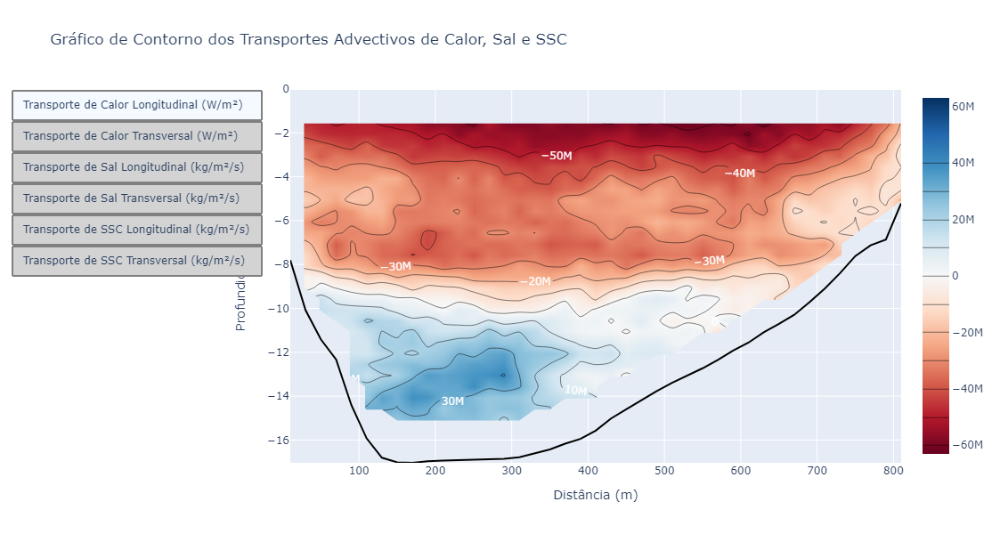

In [248]:
# Criar a figura inicial com o transporte de calor longitudinal
fig = go.Figure(data=go.Contour(
    z=dataset['transporte_calor_long'].values,  # Dados de transporte de calor longitudinal
    x=dataset['distancia'].values,  # Coordenada de distância
    y=dataset['nivel'].values,  # Coordenada de níveis
    line_smoothing=0.85,
    colorscale='RdBu',  # Escala de cores para o transporte de calor
    zmid=0,  # Centralizar o zero na cor branca
    colorbar=dict(
        titleside='right',
        titlefont=dict(size=14, family='Arial, sans-serif')),
    contours=dict(
        coloring='heatmap',
        showlabels=True,
        labelfont=dict(size=12, color='white')
    )
))

# Adicionar o fundo (profundidade)
fig.add_trace(go.Scatter(
    x=dataset['distancia'].values, 
    y=-dataset['profundidade'].values, 
    mode='lines', 
    name='Fundo', 
    line=dict(color='black')
))

# Adicionar título e rótulos dos eixos
fig.update_layout(
    title='Gráfico de Contorno dos Transportes Advectivos de Calor, Sal e SSC',
    xaxis_title='Distância (m)',
    yaxis_title='Profundidade (m)'
)

# Definir os botões de alternância para os transportes longitudinais e transversais de calor, sal e SSC
buttons = []
for i, (nome, dados_z) in enumerate([
    ('Transporte de Calor Longitudinal (W/m²)', dataset['transporte_calor_long'].values),
    ('Transporte de Calor Transversal (W/m²)', dataset['transporte_calor_transv'].values),
    ('Transporte de Sal Longitudinal (kg/m²/s)', dataset['transporte_sal_long'].values),
    ('Transporte de Sal Transversal (kg/m²/s)', dataset['transporte_sal_transv'].values),
    ('Transporte de SSC Longitudinal (kg/m²/s)', dataset['transporte_ssc_long'].values),
    ('Transporte de SSC Transversal (kg/m²/s)', dataset['transporte_ssc_transv'].values)
]):
    # Usar a mesma escala de cores para todos os transportes
    escala = 'RdBu'
    zmid = 0  # Centralizar o zero no branco

    botao = dict(
        label=nome,
        method="update",
        args=[
            {"z": [dados_z], "colorscale": escala, "zmid": zmid},  # Atualiza z, escala de cores e zmid
            {"coloraxis.colorbar.title": nome}
        ]
    )
    buttons.append(botao)

# Criar o menu suspenso
fig.update_layout(updatemenus=[dict(type="buttons",
                                    buttons=buttons,
                                    bgcolor='lightgrey',
                                    bordercolor='grey',
                                    borderwidth=2)])

# Limitar o eixo y
fig.update_layout(yaxis=dict(range=[-np.max(dataset['profundidade'].values), 0]))  # Defina os limites de profundidade

# Mudar as dimensões da figura
fig.update_layout(height=600, autosize=True)

# Exibir o gráfico
fig.show()

In [249]:
# Calcular a velocidade resultante
velocidade_resultante = np.sqrt(dataset['velocidade_longitudinal']**2 + dataset['velocidade_transversal']**2)

# Calcular a vazão resultante
vazao_resultante = velocidade_resultante * cell_area

# Somar a vazão ao longo do transecto para obter a vazão total resultante (m³/s)
vazao_total_resultante = vazao_resultante.sum(dim=['nivel', 'distancia'], skipna=True)

# Exibir o resultado da vazão total resultante
print(f"Vazão Total Resultante: {np.round(vazao_total_resultante.values, 2)} m³/s")

Vazão Total Resultante: 2041.98 m³/s


In [253]:
# Área aproximada da Seção, retirando o efeito do sidelobe e do blanking distance
area_total_aprox = (((dataset['profundidade'].mean() - 2) * (dataset['distancia'].max() - 20)) - 0.1 * (dataset['profundidade'].mean() * (dataset['distancia'].max() - 20)))

print(f"Área Total Aproximada: {np.round(area_total_aprox.values, 2)} m²")

Área Total Aproximada: 7792.79 m²


In [254]:
# Exibir os resultados dos transportes e da vazão
print(f"Vazão Total Resultante: {np.round(vazao_total_resultante.values, 2)} m³/s")
print(f"Vazão Total Longitudinal: {np.round((dataset['velocidade_longitudinal'] * cell_area).values, 2)} m³/s")
print(f"Transporte Total Líquido de Calor Longitudinal: {np.round(transporte_total_long_calor.values/10**9, 2)} GW")
print(f"Transporte Total Líquido de Sal Longitudinal: {np.round(transporte_total_sal_long.values/1000, 2)} Mg/s == toneladas/s")
print(f"Transporte Total Líquido de SSC Longitudinal: {np.round(transporte_total_ssc_long.values, 2)} kg/s")

Vazão Total Resultante: 2041.98 m³/s
Vazão Total Longitudinal: [[-3.92 -4.34 -4.42 ... -3.55 -2.46 -1.65]
 [-3.35 -3.47 -3.78 ... -3.05 -2.07 -0.86]
 [-2.9  -3.59 -3.12 ... -2.03 -1.74 -0.57]
 ...
 [  nan   nan   nan ...   nan   nan   nan]
 [  nan   nan   nan ...   nan   nan   nan]
 [  nan   nan   nan ...   nan   nan   nan]] m³/s
Transporte Total Líquido de Calor Longitudinal: -15.94 GW
Transporte Total Líquido de Sal Longitudinal: -1.76 Mg/s == toneladas/s
Transporte Total Líquido de SSC Longitudinal: -1.38 kg/s


In [257]:
# visualização do Dataset atualizado
dataset

<xarray.Dataset>
Dimensions:                  (nivel: 50, distancia: 41)
Coordinates:
  * distancia                (distancia) float64 10.0 30.0 50.0 ... 790.0 810.0
  * nivel                    (nivel) float64 -1.56 -2.06 -2.56 ... -25.56 -26.06
    profundidade             (distancia) float64 7.802 10.08 ... 6.862 5.208
Data variables: (12/14)
    temperatura              (nivel, distancia) float64 nan 25.9 ... nan nan
    salinidade               (nivel, distancia) float64 nan 14.78 ... nan nan
    turbidez                 (nivel, distancia) float64 nan 2.668 ... nan nan
    velocidade_longitudinal  (nivel, distancia) float64 nan -0.4387 ... nan nan
    velocidade_transversal   (nivel, distancia) float64 nan -0.02143 ... nan nan
    average_backscatter      (nivel, distancia) float64 nan 81.84 ... nan nan
    ...                       ...
    transporte_ssc_long      (nivel, distancia) float64 nan -0.004136 ... nan
    transporte_ssc_transv    (nivel, distancia) float64 nan -0.0002021 ... nan
    transporte_calor_long    (nivel, distancia) float64 nan -4.696e+07 ... nan
    transporte_calor_transv  (nivel, distancia) float64 nan -2.295e+06 ... nan
    transporte_sal_long      (nivel, distancia) float64 nan -5.227 ... nan nan
    transporte_sal_transv    (nivel, distancia) float64 nan -0.2554 ... nan nan

### Exportando dados processados

In [ ]:
# Exportar o Dataset para um arquivo NetCDF
#dataset.to_netcdf('dataset_exportado.nc')